# Importation :

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib as plt

# Data Init :

In [ ]:
# Check for GPU availability
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print("TensorFlow GPU device name: ", tf.test.gpu_device_name())

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        print("Memory growth enabled for GPUs")
    except RuntimeError as e:
        print(f"Error setting memory growth: {e}")

Num GPUs Available:  1
TensorFlow GPU device name:  /device:GPU:0
Memory growth enabled for GPUs


2024-11-20 10:22:58.098125: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-20 10:22:58.129260: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-20 10:22:58.129332: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-20 10:22:58.131375: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-11-20 10:22:58.131432: I external/local_xla/xla/stream_executor

In [ ]:
import numpy as np

data = np.load('training_set.npz')
X = data['images']
y = data['labels']

# Data Vizualisation :


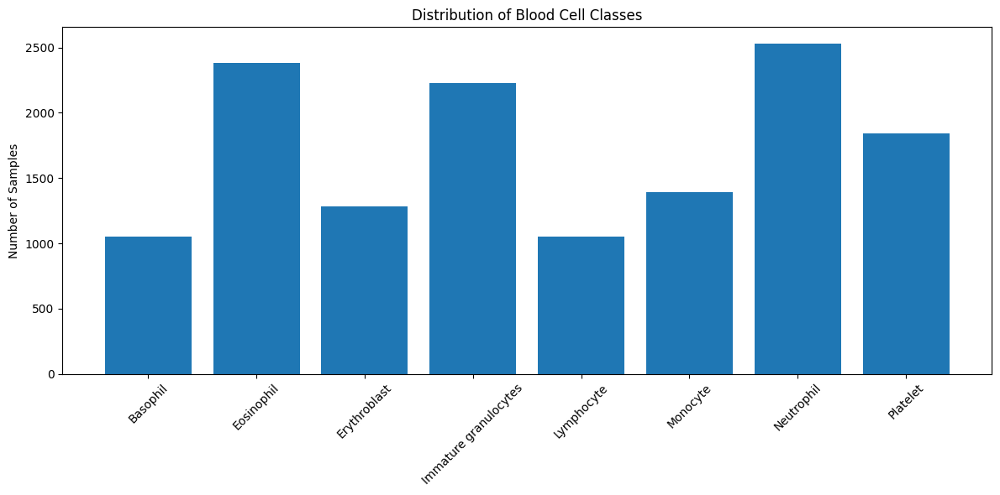

Basophil: 1052 samples
Eosinophil: 2381 samples
Erythroblast: 1285 samples
Immature granulocytes: 2226 samples
Lymphocyte: 1049 samples
Monocyte: 1393 samples
Neutrophil: 2530 samples
Platelet: 1843 samples
Image data shape: (13759, 96, 96, 3)
Label data shape: (13759, 1)

Unique classes: [0 1 2 3 4 5 6 7]
Data type of images: uint8


In [ ]:
import matplotlib.pyplot as plt  # Correct import for Matplotlib
import numpy as np

# Load the dataset
data = np.load('training_set.npz')
X = data['images']
y = data['labels']

# Define class names
class_names = ['Basophil', 'Eosinophil', 'Erythroblast', 'Immature granulocytes',
               'Lymphocyte', 'Monocyte', 'Neutrophil', 'Platelet']

# Create bar plot
plt.figure(figsize=(12, 6))
values, counts = np.unique(y, return_counts=True)
plt.bar(class_names, counts)
plt.title('Distribution of Blood Cell Classes')
plt.xticks(rotation=45)
plt.ylabel('Number of Samples')
plt.tight_layout()
plt.show()

# Print counts for each class
for name, count in zip(class_names, counts):
    print(f"{name}: {count} samples")



print(f"Image data shape: {X.shape}")
print(f"Label data shape: {y.shape}")
print(f"\nUnique classes: {np.unique(y)}")
print(f"Data type of images: {X.dtype}")

The dataset's class imbalance, with underrepresented classes like Basophil and Lymphocyte, risks biasing the model toward majority classes, requiring strategies like class weighting or data augmentation to ensure fair learning.

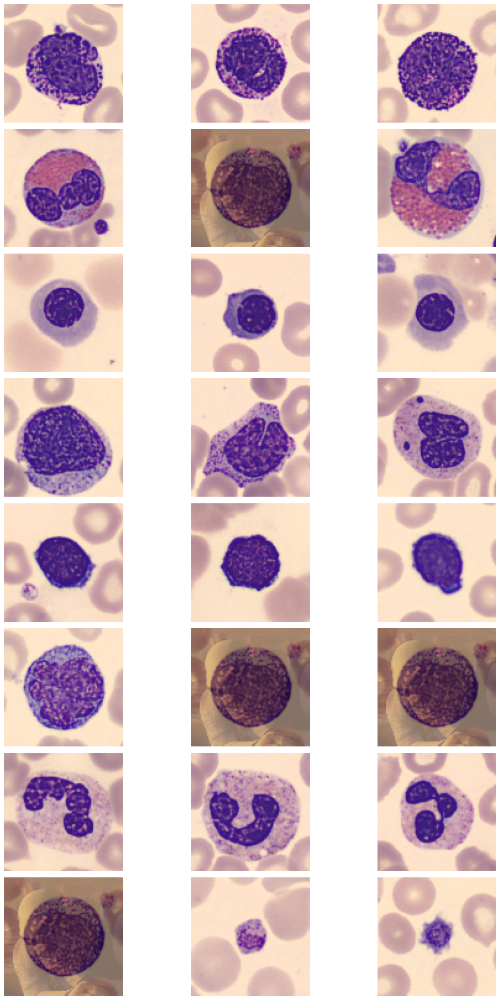

In [ ]:
def plot_sample_images(X, y, class_names, samples_per_class=3):
    fig, axes = plt.subplots(8, samples_per_class, figsize=(15, 24))
    for i in range(8):
        # Get indices for current class
        class_indices = np.where(y == i)[0]
        # Randomly select samples
        selected_indices = np.random.choice(class_indices, samples_per_class, replace=False)

        for j in range(samples_per_class):
            axes[i, j].imshow(X[selected_indices[j]])
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_ylabel(class_names[i], rotation=45, ha='right')

    plt.tight_layout()
    plt.show()

plot_sample_images(X, y, class_names)

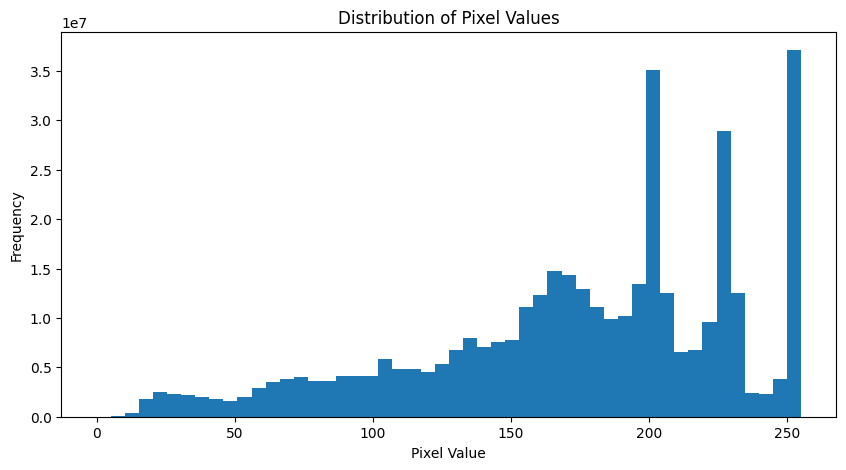

Min pixel value: 0
Max pixel value: 255
Mean pixel value: 174.15
Standard deviation: 57.76


In [ ]:
pixel_vals = X.ravel()
plt.figure(figsize=(10, 5))
plt.hist(pixel_vals, bins=50)
plt.title('Distribution of Pixel Values')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

print(f"Min pixel value: {pixel_vals.min()}")
print(f"Max pixel value: {pixel_vals.max()}")
print(f"Mean pixel value: {pixel_vals.mean():.2f}")
print(f"Standard deviation: {pixel_vals.std():.2f}")

The overall pixel intensity distribution shows sharp peaks at high intensity values, with a high mean intensity (174.15). This suggests potential issues such as overexposure or bright backgrounds in the images. Applying normalization and illumination correction can enhance data variability and improve the dataset's quality for more effective model training.

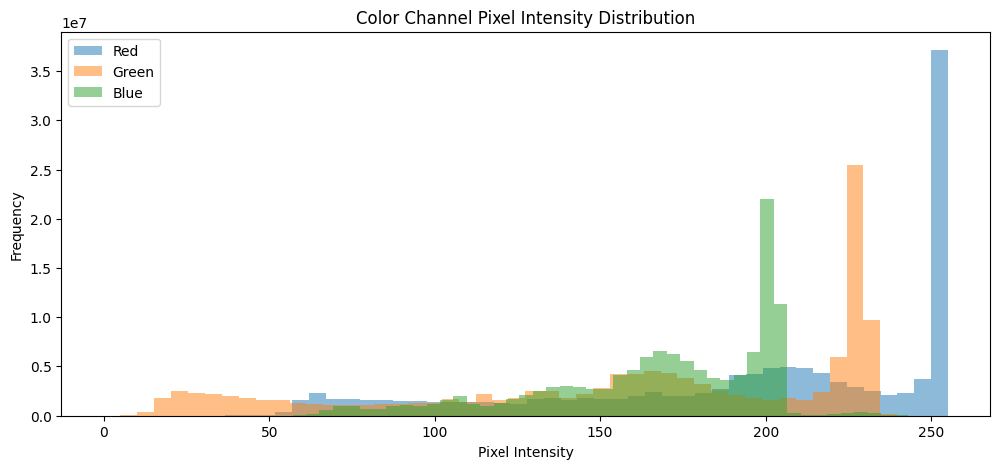

In [ ]:
color_channels = ['Red', 'Green', 'Blue']
plt.figure(figsize=(12, 5))
for i in range(3):
    channel_data = X[:, :, :, i].flatten()
    plt.hist(channel_data, bins=50, alpha=0.5, label=color_channels[i])
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.title('Color Channel Pixel Intensity Distribution')
plt.legend()
plt.show()



The pixel intensity distribution for the red, green, and blue channels reveals significant saturation, especially near high values (close to 255). This indicates a strong dominance of certain colors, which may bias the model during training. Adjusting contrast or normalizing each channel independently could help mitigate this issue and balance the contributions of each color channel.

# Removing outliers :

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import cosine_similarity

blur_threshold = 100.0
similarity_threshold = 0.99

def compute_image_hash(image):
    resized = cv2.resize(image, (8, 8), interpolation=cv2.INTER_AREA)
    gray = cv2.cvtColor(resized, cv2.COLOR_RGB2GRAY)
    mean = np.mean(gray)
    hash_str = ''
    for i in range(8):
        for j in range(8):
            hash_str += '1' if gray[i,j] >= mean else '0'
    return hash_str

def is_duplicate(image, image_hashes):
    current_hash = compute_image_hash(image)
    if current_hash in image_hashes:
        return True

    return False

face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def detect_blur(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian_var < blur_threshold

def detect_faces(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
    return len(faces) > 0

cleaned_images = []
cleaned_labels = []
outlier_images = []
outlier_labels = []
duplicate_images = []
duplicate_labels = []
image_hashes = set()

for idx, (img, label) in enumerate(zip(X, y)):
    if detect_blur(img) or detect_faces(img):
        outlier_images.append(img)
        outlier_labels.append(label)
    elif is_duplicate(img, image_hashes):
        duplicate_images.append(img)
        duplicate_labels.append(label)
    else:
        cleaned_images.append(img)
        cleaned_labels.append(label)
        image_hashes.add(compute_image_hash(img))

X_cleaned = np.array(cleaned_images)
y_cleaned = np.array(cleaned_labels)

np.savez('cleaned_training_set.npz', images=X_cleaned, labels=y_cleaned)

print("Dataset cleaned and saved as 'cleaned_training_set.npz'")
print(f"Number of original images: {len(X)}")
print(f"Number of cleaned images: {len(cleaned_images)}")
print(f"Number of duplicates removed: {len(duplicate_images)}")
print(f"Number of outliers detected: {len(outlier_images)}")


Dataset cleaned and saved as 'cleaned_training_set.npz'
Number of original images: 13759
Number of cleaned images: 10530
Number of duplicates removed: 2915
Number of outliers detected: 314


This code cleans a dataset of images by removing duplicates, blurry images, and images containing faces. It uses hashing for duplicate detection, Laplacian variance for blur detection, and Haar cascades for face detection. After filtering, the cleaned images and labels are saved to a new file. This cleaned dataset serves as the foundation before applying further data preprocessing techniques.

# Data Preprocessing

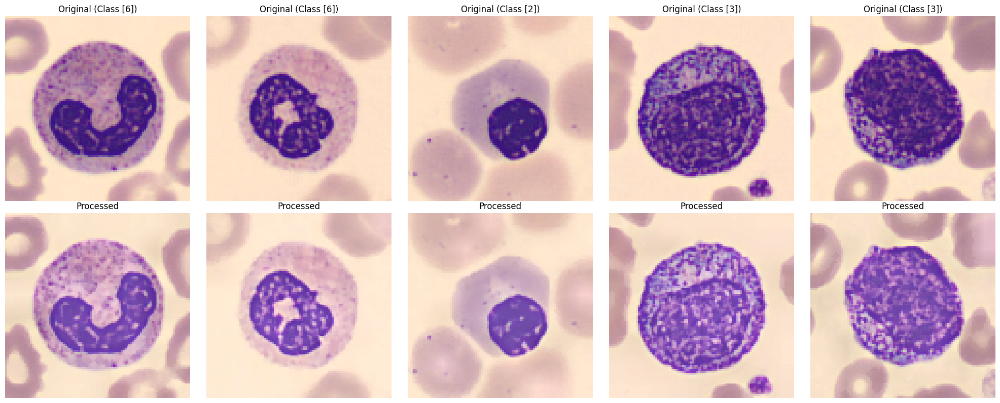

In [ ]:
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Load initial dataset
data = np.load('cleaned_training_set.npz')
X = data['images']
y = data['labels']

# Define preprocessing functions
def preprocess_image(image, size=(96, 96)):
    image = cv2.resize(image, size)
    image = cv2.bilateralFilter(image, d=5, sigmaColor=15, sigmaSpace=5)
    image = correct_illumination(image)
    image = enhance_contrast(image)
    image = segment_cells(image)
    return np.clip(image, 0, 255).astype(np.uint8)

def correct_illumination(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    kernel_size = max(7, min(image.shape[:2]) // 25)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    background = cv2.morphologyEx(l, cv2.MORPH_OPEN, kernel)
    background = cv2.GaussianBlur(background, (kernel_size, kernel_size), 0)
    corrected_l = cv2.subtract(l, background // 4)
    corrected_l = cv2.normalize(corrected_l, None, 90, 230, cv2.NORM_MINMAX)
    corrected_lab = cv2.merge([corrected_l, a, b])
    return cv2.cvtColor(corrected_lab, cv2.COLOR_LAB2RGB)

def enhance_contrast(image):
    lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=1.2, tileGridSize=(8, 8))
    enhanced_l = clahe.apply(l)
    enhanced_l = cv2.addWeighted(l, 0.5, enhanced_l, 0.5, 0)
    enhanced_lab = cv2.merge([enhanced_l, a, b])
    return cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)

def segment_cells(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
    mask = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    result = image.copy()
    result[mask == 0] = [255, 255, 255]
    return cv2.addWeighted(image, 0.9, result, 0.1, 0)

def visualize_results(original_images, processed_images, labels, num_samples=5):
    n_samples = min(num_samples, len(original_images), len(processed_images))

    plt.figure(figsize=(4 * n_samples, 8))
    for i in range(n_samples):
        plt.subplot(2, n_samples, i + 1)
        plt.imshow(original_images[i])
        plt.title(f'Original (Class {labels[i]})')
        plt.axis('off')

        plt.subplot(2, n_samples, i + n_samples + 1)
        plt.imshow(processed_images[i])
        plt.title('Processed')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process images and save results
processed_X = np.array([preprocess_image(img) for img in X])

# Visualize some examples
sample_indices = np.random.choice(len(X), 5, replace=False)
visualize_results(X[sample_indices], processed_X[sample_indices], y[sample_indices])

# Save processed dataset
np.savez('processed_training_set.npz',
         images=processed_X,
         labels=y)


This code preprocesses blood cell images by resizing, applying bilateral filtering, correcting illumination, enhancing contrast, and segmenting cells to improve quality for training. It visualizes before-and-after samples, processes the entire dataset, and saves the cleaned images and labels in a new file. This processed dataset was selected as the base dataset for training our models before applying any data augmentation techniques.

# Dataset with data augmentation and cutmix :

In [ ]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras_cv import layers as cv_layers
import keras_cv


def load_dataset(file_path='cleaned_training_set.npz'):
    data = np.load(file_path)
    X = data['images']
    y = data['labels']
    y = y.squeeze()
    return X, y

class BloodCellAugmentor:
    def __init__(self, X, y, img_size=96):
        self.X = X.astype('float32') / 255.0
        self.y = y
        self.img_size = img_size
        self.num_classes = len(np.unique(y))
        self.y_onehot = tf.keras.utils.to_categorical(y, num_classes=self.num_classes)

        self.rand_augment = keras_cv.layers.RandAugment(
            value_range=(0, 1),
            augmentations_per_image=1,
            magnitude=0.005,
            magnitude_stddev=0.001
        )
        self.cutmix_layer = cv_layers.CutMix(alpha=0.2)

    def apply_rand_augment(self, images):
        """Apply RandAugment."""
        return self.rand_augment(images)

    def apply_cutmix(self, images, labels):
        """Apply CutMix."""
        images = tf.convert_to_tensor(images, dtype=tf.float32)
        labels = tf.convert_to_tensor(labels, dtype=tf.float32)

        inputs = {"images": images, "labels": labels}
        outputs = self.cutmix_layer(inputs)
        return outputs["images"], outputs["labels"]

    def augment_batch(self, batch_size=32, p_randaugment=0.05, p_cutmix=0.05):
        """Augment a batch with probabilities for RandAugment and CutMix."""
        idx = np.random.randint(0, len(self.X), batch_size)
        x_batch = self.X[idx]
        y_batch = self.y_onehot[idx]

        if np.random.random() < p_randaugment:
            x_batch = self.apply_rand_augment(x_batch)

        if np.random.random() < p_cutmix:
            x_batch, y_batch = self.apply_cutmix(x_batch, y_batch)

        return x_batch, y_batch

    def visualize_augmentations(self, num_samples=5):
        """Visualize augmentations."""
        fig, axes = plt.subplots(3, num_samples, figsize=(15, 9))

        idx = np.random.randint(0, len(self.X), num_samples)
        original_images = self.X[idx]
        original_labels = self.y_onehot[idx]

        # Original images
        for i in range(num_samples):
            axes[0, i].imshow(original_images[i])
            axes[0, i].set_title("Original")
            axes[0, i].axis("off")

        # RandAugment
        randaug_images = self.apply_rand_augment(original_images)
        for i in range(num_samples):
            axes[1, i].imshow(randaug_images[i].numpy())
            axes[1, i].set_title("RandAugment")
            axes[1, i].axis("off")

        # CutMix
        cutmix_images, cutmix_labels = self.apply_cutmix(original_images, original_labels)
        for i in range(num_samples):
            axes[2, i].imshow(cutmix_images[i].numpy())
            axes[2, i].set_title(f"CutMix\n{cutmix_labels[i].numpy().round(2)}")
            axes[2, i].axis("off")

        plt.tight_layout()
        plt.show()

class BloodCellAugmentor:
    def __init__(self, X, y, img_size=96):
        self.X = X.astype('float32') / 255.0
        self.y = y
        self.img_size = img_size
        self.num_classes = len(np.unique(y))
        self.y_onehot = tf.keras.utils.to_categorical(y, num_classes=self.num_classes)

        # Calculate class distribution
        self.class_counts = np.bincount(y)
        self.class_weights = self.class_counts / len(y)

        # Store indices for each class
        self.class_indices = [np.where(y == i)[0] for i in range(self.num_classes)]

        self.setup_augmentation_layers()

    def setup_augmentation_layers(self):
        self.rand_augment = keras_cv.layers.RandAugment(
            value_range=(0, 1),
            augmentations_per_image=1,
            magnitude=0.005,
            magnitude_stddev=0.001
        )
        self.cutmix_layer = cv_layers.CutMix(alpha=0.2)

    def augment_batch(self, batch_size=32, maintain_distribution=True):
        if maintain_distribution:
            # Calculate samples per class based on original distribution
            samples_per_class = np.round(self.class_weights * batch_size).astype(int)
            # Adjust to ensure we get exactly batch_size samples
            while samples_per_class.sum() != batch_size:
                if samples_per_class.sum() < batch_size:
                    samples_per_class[np.argmin(samples_per_class/self.class_weights)] += 1
                else:
                    samples_per_class[np.argmax(samples_per_class/self.class_weights)] -= 1

            # Sample from each class
            x_batch = []
            y_batch = []
            for class_idx, n_samples in enumerate(samples_per_class):
                if n_samples > 0:
                    idx = np.random.choice(self.class_indices[class_idx], n_samples)
                    x_batch.append(self.X[idx])
                    y_batch.append(self.y_onehot[idx])

            x_batch = np.concatenate(x_batch)
            y_batch = np.concatenate(y_batch)
        else:
            idx = np.random.randint(0, len(self.X), batch_size)
            x_batch = self.X[idx]
            y_batch = self.y_onehot[idx]

        # Apply augmentations
        if np.random.random() < 0.05:
            x_batch = self.apply_rand_augment(x_batch)
        if np.random.random() < 0.05:
            x_batch, y_batch = self.apply_cutmix(x_batch, y_batch)

        return x_batch, y_batch

def generate_augmented_dataset(augmentor, file_path="augmented_dataset.npz", num_samples=10000, batch_size=32):
    augmented_images = []
    augmented_labels = []

    num_batches = num_samples // batch_size
    for _ in range(num_batches):
        images, labels = augmentor.augment_batch(batch_size=batch_size, maintain_distribution=True)
        augmented_images.append(images)
        augmented_labels.append(labels)

    augmented_images = np.concatenate(augmented_images, axis=0)
    augmented_labels = np.concatenate(augmented_labels, axis=0)

    np.savez_compressed(file_path, images=augmented_images, labels=augmented_labels)

    # Print class distribution
    pred_classes = np.argmax(augmented_labels, axis=1)
    class_dist = np.bincount(pred_classes) / len(pred_classes)
    print("Augmented dataset class distribution:", class_dist)
X, y = load_dataset()

augmentor = BloodCellAugmentor(X, y)

augmentor.visualize_augmentations(num_samples=5)

In [ ]:
def generate_augmented_dataset(augmentor, file_path="augmented_dataset.npz", num_samples=10000, batch_size=32):

    augmented_images = []
    augmented_labels = []

    # Generate samples in batches
    num_batches = num_samples // batch_size
    for _ in range(num_batches):
        images, labels = augmentor.augment_batch(batch_size=batch_size)
        # Directly append NumPy arrays
        augmented_images.append(images)
        augmented_labels.append(labels)

    # Concatenate all batches
    augmented_images = np.concatenate(augmented_images, axis=0)
    augmented_labels = np.concatenate(augmented_labels, axis=0)

    # Save the augmented dataset
    np.savez_compressed(file_path, images=augmented_images, labels=augmented_labels)
    print(f"Augmented dataset saved to {file_path}")



X, y = load_dataset()

# Create an augmentor instance
augmentor = BloodCellAugmentor(X, y)

# Generate and save the augmented dataset
generate_augmented_dataset(
    augmentor,
    file_path="augmented_blood_cell_dataset.npz",
    num_samples=10000,
    batch_size=32
)



The data preprocessing approach with CutMix combined with one-hot encoding did not yield satisfactory results. Therefore, we decided to proceed with the optimized dataset without applying CutMix.

# Basic CNN Model

*   Got **.27** accuracy in the **development phase test set**.
*   It was overfitting as we were getting 97.7 in the local test set.




## Data Import

In [ ]:



import numpy as np
import pandas as pd

with np.load('/kaggle/input/an2dl-blood-cells-data/training_set.npz', allow_pickle=True) as data:
  print(data.files)
  print(data['images'])
  print(data['labels'])
  X = data['images']
  y = data['labels']


['images', 'labels']
[[[[253 228 201]
   [255 229 202]
   [254 228 201]
   ...
   [253 227 203]
   [245 217 195]
   [252 226 198]]

  [[254 228 201]
   [255 229 202]
   [255 229 202]
   ...
   [255 231 205]
   [253 227 201]
   [254 230 199]]

  [[253 227 201]
   [255 229 202]
   [254 228 202]
   ...
   [255 231 202]
   [255 230 201]
   [254 230 196]]

  ...

  [[219 180 175]
   [218 179 174]
   [217 178 174]
   ...
   [255 229 202]
   [255 230 203]
   [255 230 203]]

  [[220 181 176]
   [219 180 175]
   [219 180 175]
   ...
   [255 230 203]
   [255 230 203]
   [255 231 204]]

  [[223 191 175]
   [225 192 177]
   [224 191 176]
   ...
   [255 231 204]
   [255 231 204]
   [255 230 204]]]


 [[[254 229 200]
   [255 230 200]
   [255 230 200]
   ...
   [156 117 135]
   [157 118 136]
   [156 117 135]]

  [[255 231 201]
   [255 230 200]
   [255 230 200]
   ...
   [158 119 137]
   [158 119 137]
   [157 118 136]]

  [[255 231 201]
   [255 230 200]
   [254 229 199]
   ...
   [156 117 135]
   [154

In [ ]:
X.shape , y.shape

((13759, 96, 96, 3), (13759, 1))

## Remove Outliers

In [ ]:

# Remove the outliers
# This code notes index of outlier images. Then through a loop, all matching numpy values to that of the outlier image were removed from the dataset
similar1,similar2=0,0

sam1=X[13633]
sam2=X[12379]

indices=[]
k=0
for i in X:
  if (i==sam1).all() :
    similar1+=1
    indices.append(k)


  if (i==sam2).all():
    similar2+=1
    indices.append(k)
  k+=1

indices = sorted(indices, reverse=True)
X=np.delete(X,indices,axis=0)
y=np.delete(y,indices,axis=0)

print("Number  outlier1",similar1," outlier2",similar2)

Number  outlier1 200  outlier2 1600


In [ ]:
print('Counting occurences of the target classes:')

# Convert 2d to 1d
y_flat = y.flatten()

# Calculating the distribution of the eight class

class_counts = np.bincount(y_flat, minlength = 8)
class_labels = [f"Class {i}" for i in range(8)]

# Creating the dataframe to show the distribution clearly

distribution_df = pd.DataFrame({"Class": class_labels, "Count": class_counts})
print(distribution_df)

print(y_flat)

Counting occurences of the target classes:
     Class  Count
0  Class 0    852
1  Class 1   2181
2  Class 2   1085
3  Class 3   2026
4  Class 4    849
5  Class 5    993
6  Class 6   2330
7  Class 7   1643
[7 3 6 ... 1 6 4]


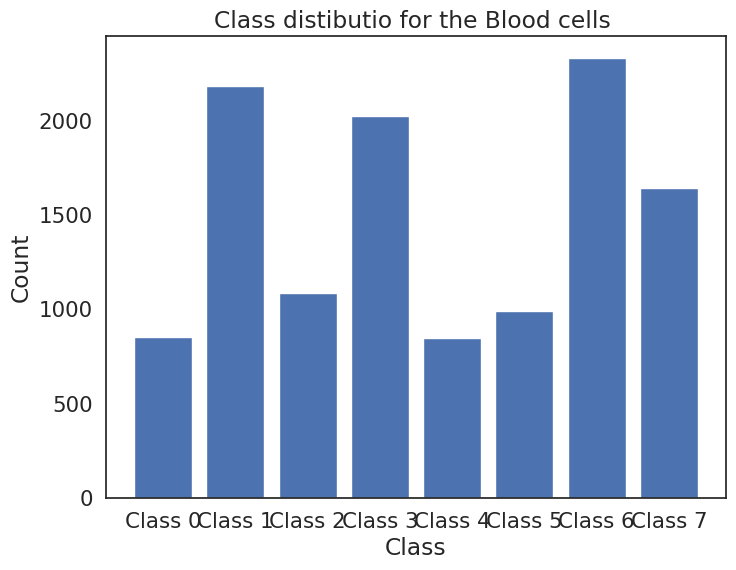

In [ ]:
plt.figure(figsize=(8,6))
plt.bar(class_labels, class_counts)
plt.xlabel("Class")
plt.ylabel("Count")
plt.title("Class distibutio for the Blood cells ")
plt.show()

In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


Num GPUs Available:  2


## Data Preprocessing

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers as tfkl

# Define preprocessing for data augmentation
preprocessing = tf.keras.Sequential([
    tfkl.RandomRotation(0.15),          # Rotate by up to ±15%
    tfkl.RandomTranslation(0.2, 0.2),  # Translate by up to 10% in both directions
    tfkl.RandomZoom(0.2),              # Zoom in/out by up to ±15%
    tfkl.RandomContrast(0.1),           # Adjust contrast by up to ±10%
    tfkl.RandomBrightness(0.1),         # Adjust brightness by up to ±10%
    tfkl.RandomFlip("horizontal"),      # Horizontal flip (vertical flip isn't biologically meaningful here)
    tfkl.RandomCrop(90, 90),            # Random cropping to 90x90
    tfkl.Resizing(96, 96),
], name='preprocessing')



In [ ]:
print("Data X", X.shape, X[0])
print("Labels y", y.shape)


Data X (11959, 96, 96, 3) [[[253 228 201]
  [255 229 202]
  [254 228 201]
  ...
  [253 227 203]
  [245 217 195]
  [252 226 198]]

 [[254 228 201]
  [255 229 202]
  [255 229 202]
  ...
  [255 231 205]
  [253 227 201]
  [254 230 199]]

 [[253 227 201]
  [255 229 202]
  [254 228 202]
  ...
  [255 231 202]
  [255 230 201]
  [254 230 196]]

 ...

 [[219 180 175]
  [218 179 174]
  [217 178 174]
  ...
  [255 229 202]
  [255 230 203]
  [255 230 203]]

 [[220 181 176]
  [219 180 175]
  [219 180 175]
  ...
  [255 230 203]
  [255 230 203]
  [255 231 204]]

 [[223 191 175]
  [225 192 177]
  [224 191 176]
  ...
  [255 231 204]
  [255 231 204]
  [255 230 204]]]
Labels y (11959, 1)


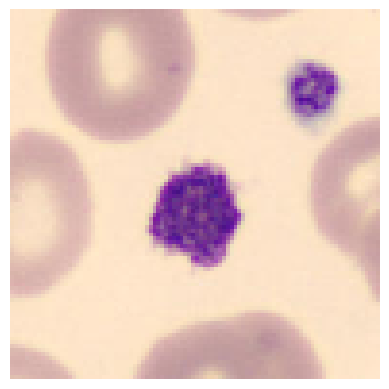

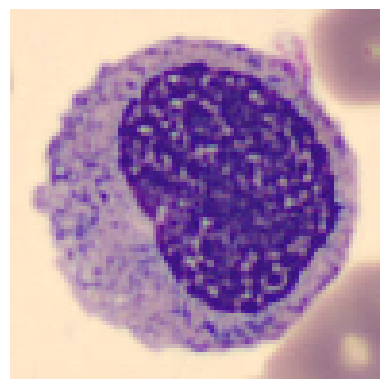

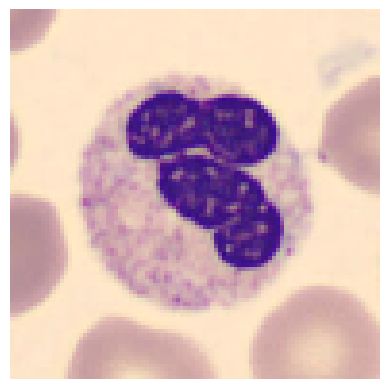

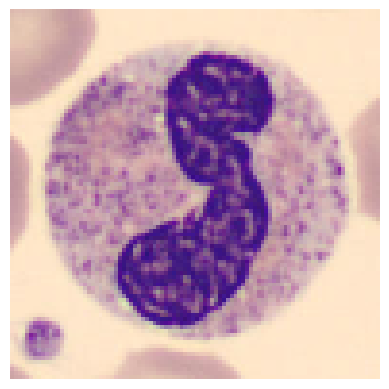

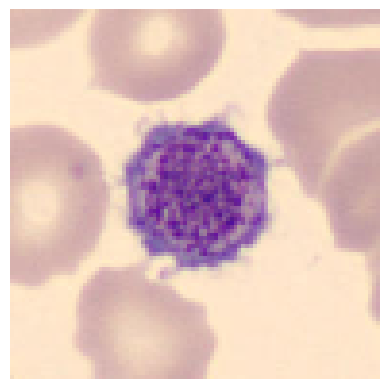

In [ ]:

for i in range(5):

    plt.imshow(X[i])
    plt.axis('off')
    plt.show()

In [ ]:
# As we can see with the help of data augmentation the dataset is balanced
print('Counting occurrences of target classes:')
print(pd.DataFrame(y, columns=['labels'])['labels'].value_counts())

Counting occurrences of target classes:
labels
6    2330
1    2181
3    2026
7    1643
2    1085
5     993
0     852
4     849
Name: count, dtype: int64


In [ ]:

X_train_val , X_test , y_train_val, y_test = train_test_split(X, y, test_size = 0.1, random_state = 42, stratify = y,shuffle = True)

In [ ]:
# Print the shapes of the loaded datasets
print("Training-Validation Data Shape:", X_train_val.shape)
print("Training-Validation Label Shape:", y_train_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", y_test.shape)

Training-Validation Data Shape: (10763, 96, 96, 3)
Training-Validation Label Shape: (10763, 1)
Test Data Shape: (1196, 96, 96, 3)
Test Label Shape: (1196, 1)


In [ ]:
# Define a mapping of labels to their corresponding digit names
labels = {0:'Basophil', 1:'Eosinophil', 2:'Erythroblast', 3:'Immature granulocytes', 4:'Lymphocyte', 5:'Monocyte', 6:'Neutrophil', 7:'Platelet'}

# Save unique labels
unique_labels = list(labels.values())

In [ ]:
## Don't run this as the y is already in integer
X_train_val = (X_train_val / 255).astype('float32')
X_test = (X_test / 255).astype('float32')

# Convert labels to categorical format using one-hot encoding
y_train_val = tfk.utils.to_categorical(y_train_val)
y_test = tfk.utils.to_categorical(y_test)

In [ ]:
# Split data into training and validation sets, maintaining class distribution
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=0.1, stratify=y_train_val, shuffle= True)

# Print the shapes of the resulting datasets
print("Training Data Shape:", X_train.shape)
print("Training Label Shape:", y_train.shape)
print("Validation Data Shape:", X_val.shape)
print("Validation Label Shape:", y_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", y_test.shape)

Training Data Shape: (9686, 96, 96, 3)
Training Label Shape: (9686, 8)
Validation Data Shape: (1077, 96, 96, 3)
Validation Label Shape: (1077, 8)
Test Data Shape: (1196, 96, 96, 3)
Test Label Shape: (1196, 8)


In [ ]:
# Don't run

# Compare categorical label and "default" label representation
# Display the categorical label
print('Categorical label:', y_train[0])
# Display the equivalent numeric label
print('"Default" label:', np.argmax(y_train[0]))

Categorical label: [0. 0. 0. 0. 0. 1. 0. 0.]
"Default" label: 5


## Model Training

In [ ]:


# Define key model parameters
input_shape = X_train.shape[1:]  # Input shape for the model
output_shape = y_train.shape[1]  # Number of unique classes for the output layer
batch_size = 128                # Batch size for training
epochs = 100                   # Number of training epochs

# Print the defined parameters
print("Epochs:", epochs)
print("Batch Size:", batch_size)
print("Input Shape:", input_shape)
print("Output Shape:", output_shape)


Epochs: 100
Batch Size: 128
Input Shape: (96, 96, 3)
Output Shape: 8


### Version1

In [ ]:
def base_model(input_shape, output_shape,augmentation=None, seed=seed):
    tf.random.set_seed(seed)

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # Apply optional data augmentation, then first convolutional layer
    if augmentation == None:
        x = tfkl.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',name='conv00')(input_layer)
        x = tfkl.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',name='conv01')(x)
        x = tfkl.MaxPooling2D(name='mp0')(x)
    else:
        x = augmentation(input_layer)
        x = tfkl.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',name='conv00')(x)
        x = tfkl.Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',name='conv01')(x)
        x = tfkl.MaxPooling2D(name='mp0')(x)

    x = tfkl.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu',name='conv10')(x)
    x = tfkl.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu',name='conv11')(x)
    x = tfkl.Conv2D(filters=64,kernel_size=3,padding='same',activation='relu',name='conv12')(x)
    x = tfkl.MaxPooling2D(name='mp1')(x)

    x = tfkl.Conv2D(filters=128,kernel_size=3,padding='same',activation='relu',name='conv20')(x)
    x = tfkl.Conv2D(filters=128,kernel_size=3,padding='same',activation='relu',name='conv21')(x)
    x = tfkl.MaxPooling2D(name='mp2')(x)

    x = tfkl.Conv2D(filters=256,kernel_size=3,padding='same',activation='relu',name='conv30')(x)
    x = tfkl.Conv2D(filters=256,kernel_size=3,padding='same',activation='relu',name='conv31')(x)
    x = tfkl.MaxPooling2D(name='mp3')(x)


    # Global Average Pooling
    x = tfkl.GlobalAveragePooling2D()(x)



    output_layer = tfkl.Dense(units=output_shape,activation='softmax',name='Output')(x)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Convnet')

    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(),optimizer=tfk.optimizers.Lion(learning_rate=1e-4),metrics=['accuracy'])
    #model.compile(optimizer=tf.keras.optimizers.Lion(learning_rate=5e-4),loss='sparse_categorical_crossentropy',metrics=['accuracy'])
    # Return the model
    return model


### Version2

In [ ]:
def build_quasiVGG9(input_shape, output_shape,augmentation=None, seed=seed):
    tf.random.set_seed(seed)

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # Apply optional data augmentation, then first convolutional layer
    if augmentation == None:
        # First Convolutional Block
        x = tfkl.Conv2D(32, (3, 3), padding='same', activation='swish')(input_layer)
        x = tfkl.BatchNormalization()(x)
        x = tfkl.Conv2D(32, (3, 3), padding='same', activation='swish')(x)
        x = tfkl.BatchNormalization()(x)
        x = tfkl.MaxPooling2D((2, 2))(x)
        x = tfkl.Dropout(0.25)(x)
    else:
        x = augmentation(input_layer)
        x = tfkl.Conv2D(32, (3, 3), padding='same', activation='swish')(x)
        x = tfkl.BatchNormalization()(x)
        x = tfkl.Conv2D(32, (3, 3), padding='same', activation='swish')(x)
        x = tfkl.BatchNormalization()(x)
        x = tfkl.MaxPooling2D((2, 2))(x)
        x = tfkl.Dropout(0.25)(x)


    # Second Convolutional Block
    x = tfkl.Conv2D(64, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(64, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.MaxPooling2D((2, 2))(x)
    x = tfkl.Dropout(0.3)(x)

    # Third Convolutional Block
    x = tfkl.Conv2D(128, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(128, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.MaxPooling2D((2, 2))(x)
    x = tfkl.Dropout(0.4)(x)

    # Fourth Convolutional Block
    x = tfkl.Conv2D(256, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(256, (3, 3), padding='same', activation='swish')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.GlobalAveragePooling2D()(x)
    x = tfkl.Dropout(0.5)(x)



    output_layer = tfkl.Dense(units=output_shape,activation='softmax',name='Output')(x)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Convnet')

    # Compile the model
    #model.compile(loss=tfk.losses.CategoricalCrossentropy(),optimizer=tfk.optimizers.Adam(learning_rate=1e-4),metrics=['accuracy'])
    model.compile(optimizer=tf.keras.optimizers.Lion(learning_rate=5e-5),loss='categorical_crossentropy',metrics=['accuracy'])
    # Return the model
    return model

### Version3

In [ ]:
def build_quasiVGG9(input_shape, output_shape,l2_reg, seed=seed):
    tf.random.set_seed(seed)

    # Build the neural network layer by layer
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    # First Convolutional Block
    x = tfkl.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(input_layer)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(32, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.MaxPooling2D((2, 2))(x)
    x = tfkl.Dropout(0.3)(x)

    # Second Convolutional Block
    x = tfkl.Conv2D(64, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(64, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.MaxPooling2D((2, 2))(x)
    x = tfkl.Dropout(0.4)(x)

    # Third Convolutional Block
    x = tfkl.Conv2D(128, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(128, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.MaxPooling2D((2, 2))(x)
    x = tfkl.Dropout(0.5)(x)

    # Fourth Convolutional Block
    x = tfkl.Conv2D(256, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.Conv2D(256, (3, 3), padding='same', kernel_regularizer=tf.keras.regularizers.l2(l2_reg), activation='relu')(x)
    x = tfkl.BatchNormalization()(x)
    x = tfkl.GlobalAveragePooling2D()(x)
    x = tfkl.Dropout(0.6)(x)



    output_layer = tfkl.Dense(units=output_shape,activation='softmax',name='Output')(x)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='Convnet')

    # Compile the model
    #model.compile(loss=tfk.losses.CategoricalCrossentropy(),optimizer=tfk.optimizers.Adam(learning_rate=1e-4),metrics=['accuracy'])
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),loss='sparse_categorical_crossentropy',metrics=['accuracy'])
    # Return the model
    return model

Model: "Convnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ Input (InputLayer)          │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv00 (Conv2D)             │ (None, 96, 96, 32)    │        896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv01 (Conv2D)             │ (None, 96, 96, 32)    │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp0 (MaxPooling2D)          │ (None, 48, 48, 32)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv10 (Conv2D)             │ (None, 48, 48, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv11 (Conv2D)             │ (None, 48, 48, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv12 (Conv2D)             │ (None, 48, 48, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp1 (MaxPooling2D)          │ (None, 24, 24, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv20 (Conv2D)             │ (None, 24, 24, 128)   │     73,856 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv21 (Conv2D)             │ (None, 24, 24, 128)   │    147,584 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp2 (MaxPooling2D)          │ (None, 12, 12, 128)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv30 (Conv2D)             │ (None, 12, 12, 256)   │    295,168 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv31 (Conv2D)             │ (None, 12, 12, 256)   │    590,080 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp3 (MaxPooling2D)          │ (None, 6, 6, 256)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_9  │ (None, 256)           │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ Output (Dense)              │ (None, 8)             │      2,056 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 1,211,240 (4.62 MB)

 Trainable params: 1,211,240 (4.62 MB)

 Non-trainable params: 0 (0.00 B)

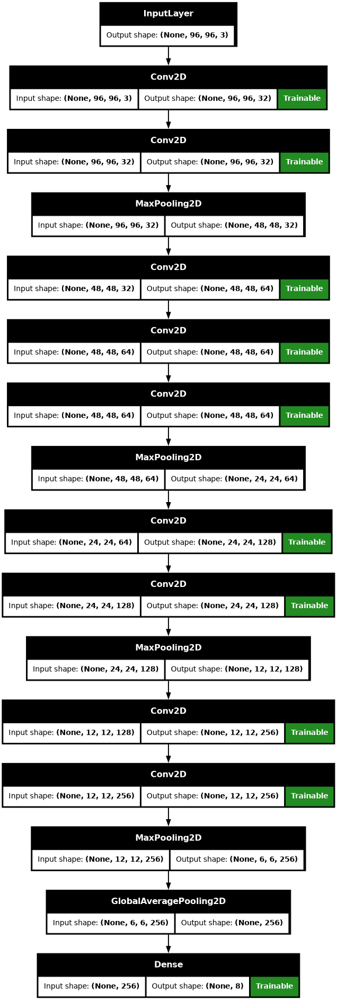

In [ ]:
# Build the quasiVGG9 model and display its summary
model = base_model(input_shape, output_shape)

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

In [ ]:
# Define early stopping callback
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_accuracy', patience=5, mode='max', restore_best_weights=True)

# Train the model and save its history
history = model.fit(
    x=X_train,
    y=y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, y_val),
    callbacks=[early_stopping]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 21s 195ms/step - accuracy: 0.1924 - loss: 2.0140 - val_accuracy: 0.2563 - val_loss: 1.7887
Epoch 2/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - accuracy: 0.3667 - loss: 1.6600 - val_accuracy: 0.4141 - val_loss: 1.4253
Epoch 3/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 112ms/step - accuracy: 0.4218 - loss: 1.3991 - val_accuracy: 0.4670 - val_loss: 1.3649
Epoch 4/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 111ms/step - accuracy: 0.4584 - loss: 1.3378 - val_accuracy: 0.4893 - val_loss: 1.3243
Epoch 5/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 110ms/step - accuracy: 0.4764 - loss: 1.2976 - val_accuracy: 0.5042 - val_loss: 1.2917
Epoch 6/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 109ms/step - accuracy: 0.4883 - loss: 1.2631 - val_accuracy: 0.5348 - val_loss: 1.2463
Epoch 7/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 108ms/step - accuracy: 0.5138 - loss: 1.2163 - val_accuracy: 0.5664 - val_loss: 1.1879
Epoch 8/100
76/76 ━━━━━━━━━━━━━━━━━━━━ 8s 108ms/step - accuracy: 0.5494 - loss: 1.1454 - val_acc

In [ ]:


# Save the trained model to a file with the accuracy included in the filename
model_filename = 'Base_model_v2'+str(final_val_accuracy)+'.keras'

model.save(model_filename)

# Delete the model to free up resources
del model

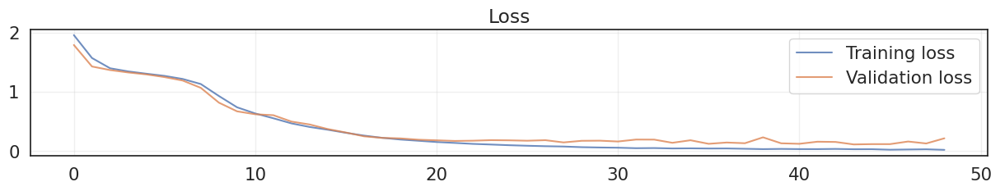

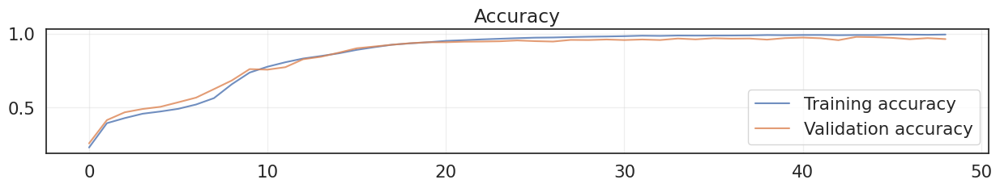

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(history['loss'], label='Training loss', alpha=.8)
plt.plot(history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Model: "Convnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ Input (InputLayer)          │ (None, 96, 96, 3)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv00 (Conv2D)             │ (None, 96, 96, 32)    │        896 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv01 (Conv2D)             │ (None, 96, 96, 32)    │      9,248 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp0 (MaxPooling2D)          │ (None, 48, 48, 32)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv10 (Conv2D)             │ (None, 48, 48, 64)    │     18,496 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv11 (Conv2D)             │ (None, 48, 48, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv12 (Conv2D)             │ (None, 48, 48, 64)    │     36,928 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp1 (MaxPooling2D)          │ (None, 24, 24, 64)    │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv20 (Conv2D)             │ (None, 24, 24, 128)   │     73,856 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv21 (Conv2D)             │ (None, 24, 24, 128)   │    147,584 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp2 (MaxPooling2D)          │ (None, 12, 12, 128)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv30 (Conv2D)             │ (None, 12, 12, 256)   │    295,168 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ conv31 (Conv2D)             │ (None, 12, 12, 256)   │    590,080 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ mp3 (MaxPooling2D)          │ (None, 6, 6, 256)     │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ global_average_pooling2d_9  │ (None, 256)           │          0 │   -   │
│ (GlobalAveragePooling2D)    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ Output (Dense)              │ (None, 8)             │      2,056 │   Y   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 2,422,482 (9.24 MB)

 Trainable params: 1,211,240 (4.62 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,211,242 (4.62 MB)

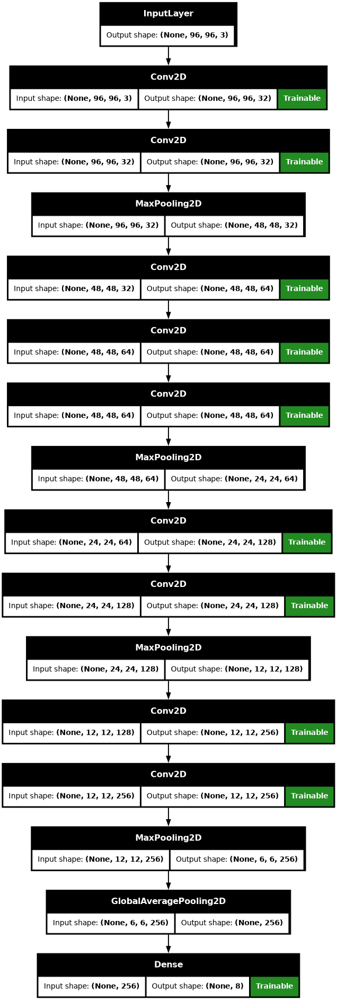

In [ ]:
# Load the saved model
model = tfk.models.load_model('Base_model_v297.77.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

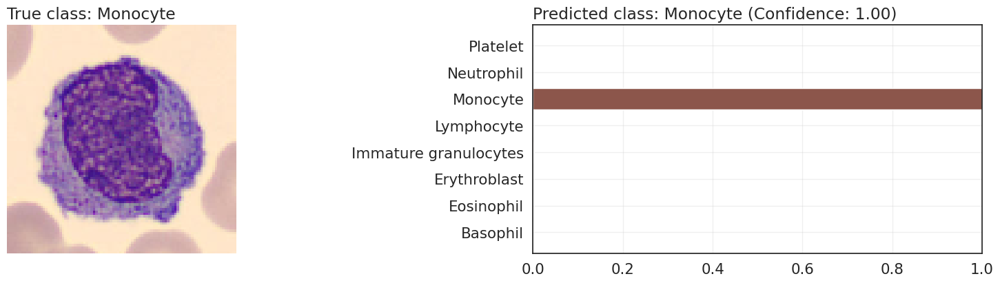

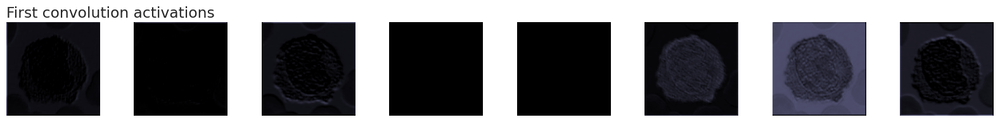

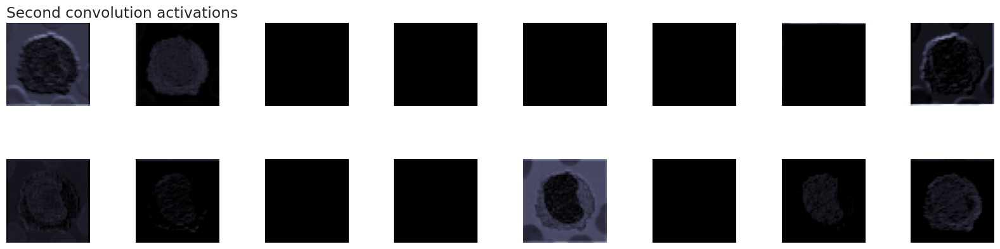

In [ ]:
def extract_activations(model, X, num_images):

    # Identify the first convolutional layer
    first_conv_index = None
    for i, layer in enumerate(model.layers):
        if isinstance(layer, tfk.layers.Conv2D):
            first_conv_index = i
            break

    if first_conv_index is None:
        raise ValueError("The model does not contain a 2D convolution")

    # Extract activations from the first convolutional layer
    first_conv = tfk.Sequential(model.layers[:first_conv_index + 1])
    first_activations = first_conv(X[:num_images])

    # Identify the first pooling layer after the first convolution
    pooling_index = None
    for i, layer in enumerate(model.layers[first_conv_index + 1:], start=first_conv_index + 1):
        if isinstance(layer, (tfk.layers.MaxPooling2D, tfk.layers.AveragePooling2D)):
            pooling_index = i
            break

    if pooling_index is None:
        raise ValueError("The model does not contain a 2D pooling operation after the first convolution")

    # Extract activations from the first convolution and the first pooling layer
    second_conv = tfk.Sequential(model.layers[:pooling_index + 1])
    second_activations = second_conv(X[:num_images])

    return first_activations, second_activations

def find_last_conv_layer(model):

    # Identify the last convolutional layer in the model
    for layer in reversed(model.layers):
        if isinstance(layer, tfk.layers.Conv2D):
            return layer.name
    raise ValueError("No Conv2D layer found in the model.")

def visualize(model, X, y, unique_labels, num_images=50, display_activations=True):

    # Extract activations from the model
    first_activations, second_activations = extract_activations(model, X, num_images)

    # Select a random image for prediction and visualisation
    image = np.random.randint(0, num_images)
    predictions = model.predict(np.expand_dims(X[image], axis=0), verbose=0)
    class_int = np.argmax(predictions[0])
    class_str = unique_labels[class_int]

    # Create figure layout for displaying the image and predictions
    fig = plt.figure(constrained_layout=True, figsize=(16, 4))
    gs = gridspec.GridSpec(1, 2, figure=fig, width_ratios=[1.5, 1.5], wspace=0)

    # Display the selected image with the true class
    ax1 = fig.add_subplot(gs[0])
    ax1.set_title(f"True class: {unique_labels[np.argmax(y[image])]}", loc='left')
    if X[image].shape[-1] == 1:
        ax1.imshow(np.squeeze(X[image]), cmap='bone', vmin=0., vmax=1.)
    else:
        ax1.imshow(np.squeeze(X[image]), vmin=0., vmax=1.)
    ax1.axis('off')

    # Display the prediction bar
    ax2 = fig.add_subplot(gs[1])
    ax2.barh(unique_labels, np.squeeze(predictions, axis=0), color=plt.get_cmap('tab10').colors)
    ax2.set_title(f"Predicted class: {class_str} (Confidence: {max(np.squeeze(predictions, axis=0)):.2f})", loc='left')
    ax2.grid(alpha=0.3)
    ax2.set_xlim(0.0, 1.0)

    plt.show()

    # Display activations if required
    if display_activations:
        # Visualise the activations from the first convolutional layer
        fig, axes = plt.subplots(1, 8, figsize=(16, 14))
        for i in range(8):
            ax = axes[i]
            ax.imshow(first_activations[image, :, :, i], cmap='bone', vmin=0., vmax=1.)
            ax.axis('off')
            if i == 0:
                ax.set_title('First convolution activations', loc='left')
        plt.tight_layout()
        plt.show()

        # Visualise the activations from the first pooling layer
        fig, axes = plt.subplots(2, 8, figsize=(16, 5))
        for i in range(16):
            ax = axes[i // 8, i % 8]
            ax.imshow(second_activations[image, :, :, i], cmap='bone', vmin=0., vmax=1.)
            ax.axis('off')
            if i == 0:
                ax.set_title('Second convolution activations', loc='left')
        plt.tight_layout()
        plt.show()

# Example usage
visualize(model, X_test, y_test, unique_labels, display_activations=True)

## Inference

In [ ]:
# Predict labels for the entire test set
predictions = model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1196, 8)


Accuracy score over the test set: 0.9666
Precision score over the test set: 0.9678
Recall score over the test set: 0.9666
F1 score over the test set: 0.9667


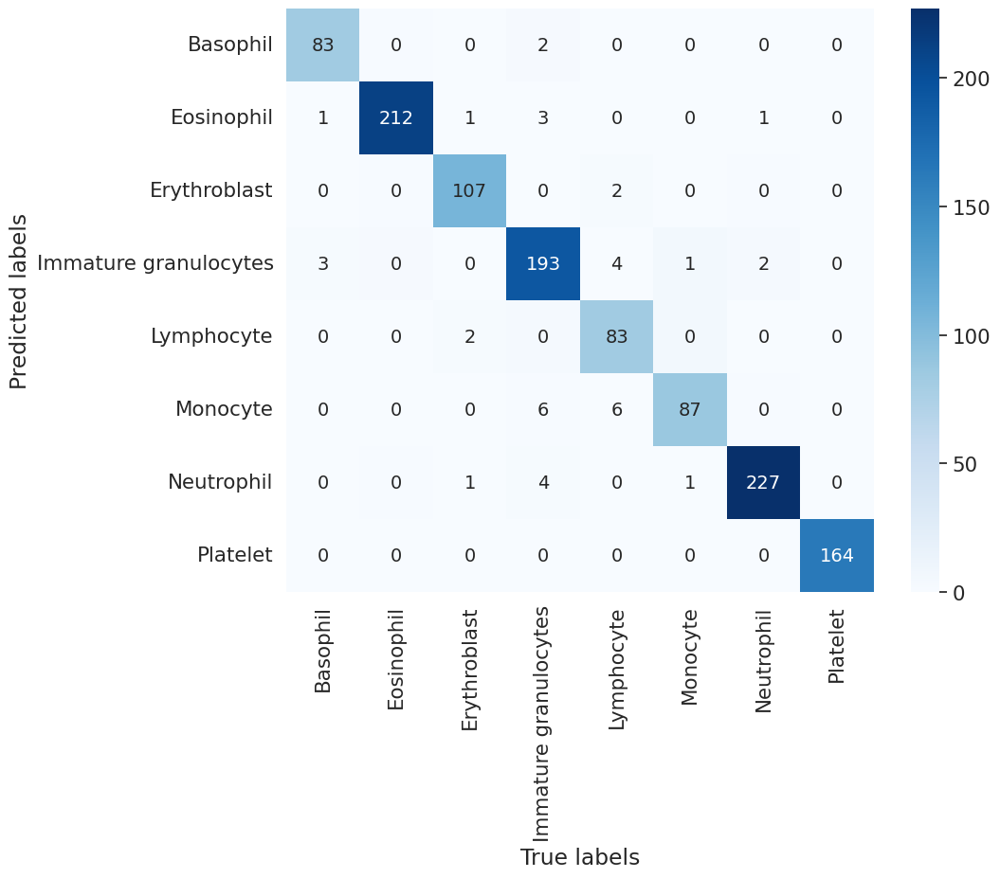

In [ ]:
# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# Basic CNN with data augmentation :

In [ ]:
import numpy as np
import tensorflow as tf
import keras as tfk
from tensorflow.keras import layers, models, callbacks, Input
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import Input

def create_model():
    model = models.Sequential([
        # Convolutional Layers
        layers.RandomFlip("horizontal", input_shape=(96, 96, 3)),
        layers.RandomRotation(0.1),
        layers.RandomContrast(0.05),
        layers.RandomBrightness(0.05),
        layers.GaussianNoise(0.03),
        layers.Rescaling(1./255),


        layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.SpatialDropout2D(0.5),

        layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.SpatialDropout2D(0.5),

        layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.SpatialDropout2D(0.5),

        layers.Flatten(),
        layers.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(8, activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

### Train the model :

/home/malvin/.local/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100


2024-11-20 10:23:52.815487: I external/local_xla/xla/service/service.cc:168] XLA service 0x56068e9bb680 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-20 10:23:52.815539: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-11-20 10:23:52.908488: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 10:23:53.633327: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
I0000 00:00:1732094646.134793   13838 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


259/264 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - accuracy: 0.3462 - loss: 2.9267

2024-11-20 10:24:19.355471: I external/local_xla/xla/stream_executor/gpu/asm_compiler.cc:326] ptxas warning : Registers are spilled to local memory in function 'fusion_69', 64 bytes spill stores, 64 bytes spill loads



264/264 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step - accuracy: 0.3485 - loss: 2.9166 - val_accuracy: 0.0988 - val_loss: 11.3011 - learning_rate: 1.0000e-04
Epoch 2/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.5845 - loss: 1.9510 - val_accuracy: 0.1752 - val_loss: 5.8533 - learning_rate: 1.0000e-04
Epoch 3/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accuracy: 0.6599 - loss: 1.6773 - val_accuracy: 0.5176 - val_loss: 2.0718 - learning_rate: 1.0000e-04
Epoch 4/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7076 - loss: 1.4890 - val_accuracy: 0.6638 - val_loss: 1.6500 - learning_rate: 1.0000e-04
Epoch 5/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accuracy: 0.7438 - loss: 1.3898 - val_accuracy: 0.7564 - val_loss: 1.3180 - learning_rate: 1.0000e-04
Epoch 6/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.7550 - loss: 1.3362 - val_accuracy: 0.7388 - val_loss: 1.3932 - learning_rate: 1.0000e-04
Epoch 7/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accura

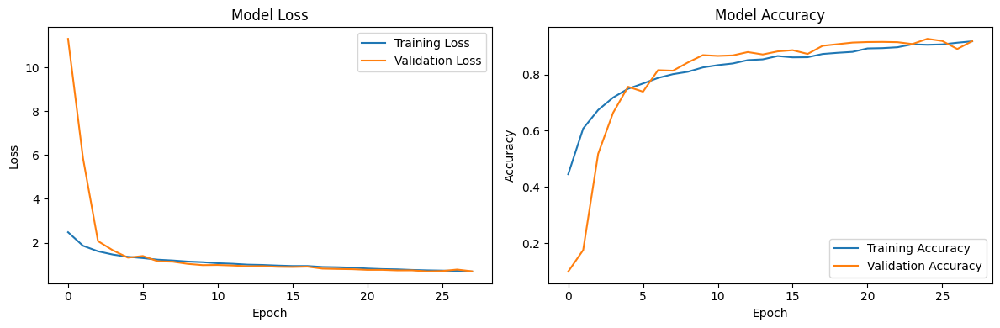

In [ ]:
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

# Load data
data = np.load('processed_training_set.npz')
X = data['images']
y = data['labels']

# Split data
def preprocess_data(X, y, test_size=0.2):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=42, stratify=y)
    return X_train, X_val, y_train, y_val

X_train, X_val, y_train, y_val = preprocess_data(X, y)

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y),
    y=y.flatten()
)
class_weights_dict = dict(enumerate(class_weights))


# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_cnn_augmentation.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=3,
        min_lr=1e-6
    )
]

# Initialize the model
model = create_model()

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=100,
    validation_data=(X_val, y_val),
    class_weight=class_weights_dict,
    callbacks=callbacks_list,
    batch_size=32
)

# Plot training history
plt.figure(figsize=(12, 4))

# Plot loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot accuracy
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Save model weights
model.save_weights('weights_cnn_augmentation.weights.h5')
model.save('cnn_augmentation.keras')


### submission :

In [ ]:
%%writefile model.py

import numpy as np
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras import models

class Model:
    def __init__(self):
        """
        Initialize the internal state of the model. Note that the __init__
        method cannot accept any arguments.

        The following is an example loading the weights of a pre-trained
        model.
        """
        self.neural_network = self._create_model()
        self.neural_network.load_weights('weights_cnn_augmentation.weights.h5')

    def _create_model(self):
        model = models.Sequential([
            # Scaling Layer (no data augmentation)
            tfkl.Rescaling(1./255, input_shape=(96, 96, 3)),

            # Convolutional Layers
            tfkl.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
            tfkl.BatchNormalization(),
            tfkl.MaxPooling2D((2, 2)),
            tfkl.SpatialDropout2D(0.3),

            tfkl.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
            tfkl.BatchNormalization(),
            tfkl.MaxPooling2D((2, 2)),
            tfkl.SpatialDropout2D(0.5),

            tfkl.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
            tfkl.BatchNormalization(),
            tfkl.MaxPooling2D((2, 2)),
            tfkl.SpatialDropout2D(0.5),

            tfkl.Flatten(),
            tfkl.Dense(128, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.001)),
            tfkl.BatchNormalization(),
            tfkl.Dropout(0.5),
            tfkl.Dense(8, activation='softmax')
        ])

        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )

        return model

    def predict(self, X):
        """
        Predict the labels corresponding to the input X. Note that X is a numpy
        array of shape (n_samples, 96, 96, 3) and the output should be a numpy
        array of shape (n_samples,). Therefore, outputs must not be one-hot
        encoded.

        The following is an example of a prediction from the pre-trained model
        loaded in the __init__ method.
        """
        preds = self.neural_network.predict(X)
        if len(preds.shape) == 2:
            preds = np.argmax(preds, axis=1)
        return preds



### zip it :

In [ ]:
from datetime import datetime
import zipfile

# Generate a filename with the current date and time
filename = f'submission_cnn_augmentation_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

with zipfile.ZipFile(filename, 'w') as zipf:
    zipf.write('model.py')
    zipf.write('weights_cnn_augmentation.weights.h5')

print(f"Created zip file: {filename}")

### Test it :

In [ ]:
import numpy as np
from model import Model
from sklearn.metrics import accuracy_score

data = np.load('training_set.npz')
X_test = data['images']
y_true = data['labels']

model = Model()

predictions = model.predict(X_test)

accuracy = accuracy_score(y_true, predictions)
print("Accuracy:", accuracy)

# Resnet50 with "manual" augmentation:

Epoch 1/100


2024-11-20 10:26:30.773092: I external/local_tsl/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


264/264 ━━━━━━━━━━━━━━━━━━━━ 117s 320ms/step - accuracy: 0.3327 - loss: 2.4484 - val_accuracy: 0.4862 - val_loss: 1.7452 - learning_rate: 5.0000e-05
Epoch 2/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 72s 273ms/step - accuracy: 0.6373 - loss: 1.2070 - val_accuracy: 0.4046 - val_loss: 2.2867 - learning_rate: 5.0000e-05
Epoch 3/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 75s 285ms/step - accuracy: 0.7464 - loss: 0.8463 - val_accuracy: 0.8086 - val_loss: 0.7473 - learning_rate: 5.0000e-05
Epoch 4/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 73s 275ms/step - accuracy: 0.7986 - loss: 0.7013 - val_accuracy: 0.8647 - val_loss: 0.4834 - learning_rate: 5.0000e-05
Epoch 5/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 73s 275ms/step - accuracy: 0.8367 - loss: 0.5833 - val_accuracy: 0.4520 - val_loss: 1.9371 - learning_rate: 5.0000e-05
Epoch 6/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 71s 270ms/step - accuracy: 0.8402 - loss: 0.5561 - val_accuracy: 0.8557 - val_loss: 0.5081 - learning_rate: 5.0000e-05
Epoch 7/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 83s 274ms/

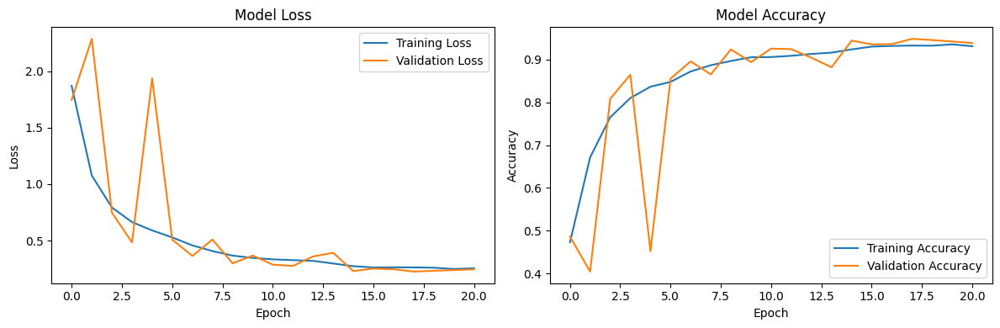

: 

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, applications
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight

data = np.load('processed_training_set.npz')
X = data['images']
y = data['labels']


num_classes = 8
input_shape = (96, 96, 3)

def create_model():
    base_model = applications.ResNet50V2(
        weights='imagenet',
        include_top=False,
        input_shape=input_shape
    )

    for layer in base_model.layers[-10:]:
        layer.trainable = True

    # Input layer
    inputs = layers.Input(shape=input_shape)

    # data augmentation
    x = layers.RandomFlip("horizontal")(inputs)
    x = layers.RandomRotation(0.4)(x)
    x = layers.RandomTranslation(0.4, 0.4)(x)
    x = layers.RandomBrightness(0.4)(x)
    x = layers.RandomContrast(0.4)(x)
    x = layers.RandomZoom(0.2)(x)
    x = layers.Rescaling(1./255)(x)

    x = base_model(x)

    # Global pooling and dropout
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)

    # Dense layers
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)

    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs, outputs)

    initial_learning_rate = 5e-5
    optimizer = tf.keras.optimizers.Lion(learning_rate=initial_learning_rate)

    model.compile(
        optimizer=optimizer,
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

np.random.seed(42)
tf.random.set_seed(42)


# Split data
def preprocess_data(X, y, test_size=0.2):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=42, stratify=y)
    return X_train, X_val, y_train, y_val

X_train, X_val, y_train, y_val = preprocess_data(X, y)

# Calculate class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y),
    y=y.flatten()
)
class_weights_dict = dict(enumerate(class_weights))

# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_resnet50v2_finetuned.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=2,
        min_lr=1e-6
    )
]

# Initialize the model
model = create_model()

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=100,
    validation_data=(X_val, y_val),
    class_weight=class_weights_dict,
    callbacks=callbacks_list,
    batch_size=32
)

# Plot training history
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

# Save model weights and complete model
model.save_weights('weights_resnet50v2_finetuned.weights.h5')
model.save('resnet50v2_finetuned_model.keras')


In [ ]:
%%writefile model.py

import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models, applications

class Model:
    def __init__(self):
        num_classes = 8
        input_shape = (96, 96, 3)

        base_model = applications.ResNet50V2(
            weights=None,
            include_top=False,
            input_shape=input_shape
        )

        for layer in base_model.layers[-5:]:
            layer.trainable = True

        inputs = layers.Input(shape=input_shape)

        x = layers.Rescaling(1. / 255)(inputs)

        x = base_model(x)

        x = layers.GlobalAveragePooling2D()(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)

        x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)

        outputs = layers.Dense(num_classes, activation='softmax')(x)

        self.model = models.Model(inputs, outputs)

        self.model.load_weights('weights_resnet50v2_finetuned.weights.h5')

    @staticmethod
    def preprocess_image(image, size=(96, 96)):
        image = cv2.resize(image, size)
        image = cv2.bilateralFilter(image, d=5, sigmaColor=15, sigmaSpace=5)
        image = Model.correct_illumination(image)
        image = Model.enhance_contrast(image)
        image = Model.segment_cells(image)
        return np.clip(image, 0, 255).astype(np.uint8)

    @staticmethod
    def correct_illumination(image):
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        kernel_size = max(7, min(image.shape[:2]) // 25)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
        background = cv2.morphologyEx(l, cv2.MORPH_OPEN, kernel)
        background = cv2.GaussianBlur(background, (kernel_size, kernel_size), 0)
        corrected_l = cv2.subtract(l, background // 3)
        corrected_l = cv2.normalize(corrected_l, None, 90, 230, cv2.NORM_MINMAX)
        corrected_lab = cv2.merge([corrected_l, a, b])
        return cv2.cvtColor(corrected_lab, cv2.COLOR_LAB2RGB)

    @staticmethod
    def enhance_contrast(image):
        lab = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8, 8))
        enhanced_l = clahe.apply(l)
        enhanced_l = cv2.addWeighted(l, 0.5, enhanced_l, 0.5, 0)
        enhanced_lab = cv2.merge([enhanced_l, a, b])
        return cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2RGB)

    @staticmethod
    def segment_cells(image):
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
        _, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        mask = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
        result = image.copy()
        result[mask == 0] = [255, 255, 255]
        return cv2.addWeighted(image, 0.9, result, 0.1, 0)

    def predict(self, X):
        X = np.asarray(X)
        X = np.array([Model.preprocess_image(img) for img in X])
        predictions = self.model.predict(X)
        return np.argmax(predictions, axis=1)


In [ ]:
from datetime import datetime
import zipfile

# Generate a filename with the current date and time
filename = f'submission_resnet50v2_finetuned_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

with zipfile.ZipFile(filename, 'w') as zipf:
    zipf.write('model.py')
    zipf.write('weights_resnet50v2_finetuned.weights.h5')

print(f"Created zip file: {filename}")

# Resnet50 with randaugmented :

2024-11-20 11:14:23.994560: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-20 11:14:23.994667: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-20 11:14:24.055686: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 11:14:24.186923: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-20 11:14:25.705478: W tensorflow/compiler/tf2

Epoch 1/100


2024-11-20 11:14:47.699818: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 931627008 exceeds 10% of free system memory.
2024-11-20 11:15:04.539526: I external/local_xla/xla/service/service.cc:168] XLA service 0x55a1d0fe42a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-20 11:15:04.539559: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-11-20 11:15:05.275737: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 11:15:08.702849: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
I0000 00:00:1732097745.744767   44319 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


264/264 ━━━━━━━━━━━━━━━━━━━━ 138s 302ms/step - accuracy: 0.3867 - loss: 2.2615 - val_accuracy: 0.3086 - val_loss: 13.4388 - learning_rate: 5.0000e-05
Epoch 2/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - accuracy: 0.6921 - loss: 1.0695 - val_accuracy: 0.7816 - val_loss: 0.8507 - learning_rate: 5.0000e-05
Epoch 3/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 30s 113ms/step - accuracy: 0.7641 - loss: 0.7651 - val_accuracy: 0.8837 - val_loss: 0.4399 - learning_rate: 5.0000e-05
Epoch 4/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 31s 114ms/step - accuracy: 0.8166 - loss: 0.6232 - val_accuracy: 0.8984 - val_loss: 0.3706 - learning_rate: 5.0000e-05
Epoch 5/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 30s 111ms/step - accuracy: 0.8580 - loss: 0.5235 - val_accuracy: 0.9008 - val_loss: 0.3939 - learning_rate: 5.0000e-05
Epoch 6/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 31s 115ms/step - accuracy: 0.8768 - loss: 0.4514 - val_accuracy: 0.9136 - val_loss: 0.3545 - learning_rate: 5.0000e-05
Epoch 7/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 31s 116ms

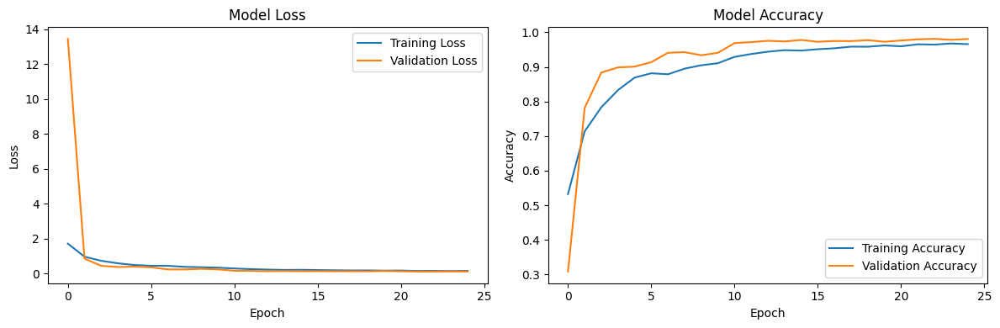

: 

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, applications
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from keras_cv.layers import RandAugment

# Create augmentation layer once
rand_augment = RandAugment(
    value_range=(0, 255),
    augmentations_per_image=2,
    magnitude=0.3,
    magnitude_stddev=0.2,
    rate=0.9
)

def preprocess_train(image, label):
    image = tf.cast(image, tf.float32)
    image = rand_augment(image)
    image = image / 255.0
    return image, label

def preprocess_val(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

def create_datasets(X, y, batch_size=32):
    # Convert to float32 before creating datasets
    X = X.astype('float32')

    # Create training dataset
    train_ds = tf.data.Dataset.from_tensor_slices((X, y))
    train_ds = (train_ds
        .shuffle(1000)
        .map(preprocess_train, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    # Create validation dataset
    val_ds = tf.data.Dataset.from_tensor_slices((X, y))
    val_ds = (val_ds
        .map(preprocess_val, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    return train_ds, val_ds

def create_model():
    base_model = applications.ResNet50V2(
        weights='imagenet',
        include_top=False,
        input_shape=(96, 96, 3)
    )

    for layer in base_model.layers[-10:]:
        layer.trainable = True

    inputs = layers.Input(shape=(96, 96, 3))
    x = base_model(inputs)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(8, activation='softmax')(x)

    model = models.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Lion(learning_rate=5e-5),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Load data
data = np.load('processed_training_set.npz')
X_train, X_val, y_train, y_val = train_test_split(
    data['images'], data['labels'],
    test_size=0.2, random_state=42,
    stratify=data['labels']
)

# Create datasets
train_ds, _ = create_datasets(X_train, y_train)
_, val_ds = create_datasets(X_val, y_val)

# Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(data['labels']),
    y=data['labels'].flatten()
)
class_weights_dict = dict(enumerate(class_weights))

# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_resnet50v2_finetuned_keras.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=2,
        min_lr=1e-6
    )
]

# Train
model = create_model()
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)

# Plot results
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

# Save model
model.save_weights('weights_resnet50v2_finetuned_keras.weights.h5')
model.save('resnet50v2_finetuned_model_keras.keras')

In [ ]:
%%writefile model.py
# file: model.py

import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications

class Model:
    def __init__(self):
        """Initializes the model's internal state and loads weights."""

        num_classes = 8
        input_shape = (96, 96, 3)

        base_model = applications.EfficientNetV2B0(
            weights=None,
            include_top=False,
            input_shape=input_shape
        )

        for layer in base_model.layers[-30:]:
            layer.trainable = True

        inputs = layers.Input(shape=input_shape)

        x = layers.Rescaling(1./255)(inputs)

        x = base_model(x)

        x = layers.GlobalAveragePooling2D()(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.3)(x)


        outputs = layers.Dense(num_classes, activation='softmax')(x)

        self.model = models.Model(inputs, outputs)

        self.model.load_weights('weights_resnet50v2_finetuned_keras.weights.h5')

    def predict(self, X):

        X = np.asarray(X)
        predictions = self.model.predict(X)
        return np.argmax(predictions, axis=1)


# EfficientNetV2B0 augmented :

EfficientNetV2B0 is well-suited for processing 96x96 images. When augmented, this model achieved an accuracy of 0.80 on the Codabench test set.

2024-11-20 11:43:40.016616: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-20 11:43:40.016704: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-20 11:43:40.076441: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 11:43:40.195349: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-20 11:43:41.737238: W tensorflow/compiler/tf2

Epoch 1/100


2024-11-20 11:43:59.601906: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 931627008 exceeds 10% of free system memory.
2024-11-20 11:44:25.678933: I external/local_xla/xla/service/service.cc:168] XLA service 0x55a8db401d20 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-20 11:44:25.678993: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-11-20 11:44:26.988886: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 11:44:33.235831: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
I0000 00:00:1732099545.369685   61877 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


264/264 ━━━━━━━━━━━━━━━━━━━━ 247s 535ms/step - accuracy: 0.2042 - loss: 3.0032 - val_accuracy: 0.1909 - val_loss: 2.2938 - learning_rate: 5.0000e-05
Epoch 2/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - accuracy: 0.4432 - loss: 1.8761 - val_accuracy: 0.2654 - val_loss: 1.9763 - learning_rate: 5.0000e-05
Epoch 3/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 153ms/step - accuracy: 0.5806 - loss: 1.2748 - val_accuracy: 0.8609 - val_loss: 0.4948 - learning_rate: 5.0000e-05
Epoch 4/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - accuracy: 0.6791 - loss: 0.9802 - val_accuracy: 0.8542 - val_loss: 0.4727 - learning_rate: 5.0000e-05
Epoch 5/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - accuracy: 0.7455 - loss: 0.8265 - val_accuracy: 0.7877 - val_loss: 0.7319 - learning_rate: 5.0000e-05
Epoch 6/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - accuracy: 0.7604 - loss: 0.7958 - val_accuracy: 0.7764 - val_loss: 0.7522 - learning_rate: 5.0000e-05
Epoch 7/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/

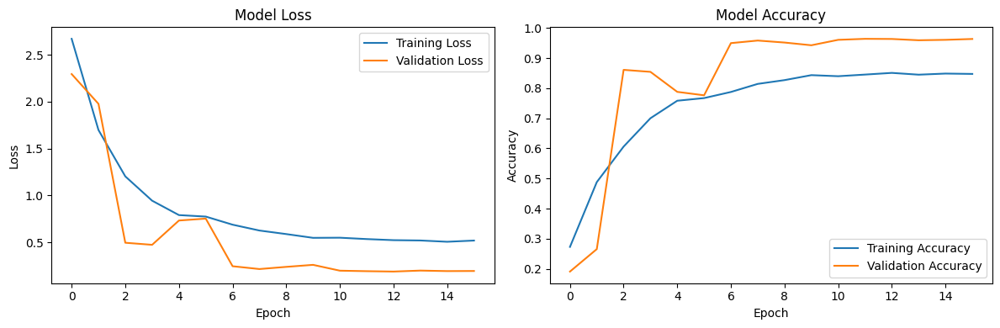

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, applications
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from keras_cv.layers import RandAugment

# Create augmentation layer once
rand_augment = RandAugment(
    value_range=(0, 255),
    augmentations_per_image=3,
    magnitude=0.6,
    magnitude_stddev=0.4,
    rate=1.0
)

def preprocess_train(image, label):
    image = tf.cast(image, tf.float32)
    image = rand_augment(image)

    # Normalize
    image = image / 255.0
    return image, label

def preprocess_val(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

def create_datasets(X, y, batch_size=32):
    # Convert to float32 before creating datasets
    X = X.astype('float32')

    # Create training dataset
    train_ds = tf.data.Dataset.from_tensor_slices((X, y))
    train_ds = (train_ds
        .shuffle(1000)
        .map(preprocess_train, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    # Create validation dataset
    val_ds = tf.data.Dataset.from_tensor_slices((X, y))
    val_ds = (val_ds
        .map(preprocess_val, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    return train_ds, val_ds

def create_model():
    base_model = applications.EfficientNetV2B0(
        weights='imagenet',
        include_top=False,
        input_shape=(96, 96, 3)
    )

    for layer in base_model.layers[-10:]:
        layer.trainable = True

    inputs = layers.Input(shape=(96, 96, 3))
    x = base_model(inputs)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.0001))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.5)(x)
    outputs = layers.Dense(8, activation='softmax')(x)

    model = models.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Lion(learning_rate=5e-5),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Load data
data = np.load('processed_training_set.npz')
X_train, X_val, y_train, y_val = train_test_split(
    data['images'], data['labels'],
    test_size=0.2, random_state=42,
    stratify=data['labels']
)

# Create datasets
train_ds, _ = create_datasets(X_train, y_train)
_, val_ds = create_datasets(X_val, y_val)

# Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(data['labels']),
    y=data['labels'].flatten()
)
class_weights_dict = dict(enumerate(class_weights))

# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_resnet50v2_finetuned_keras2.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=2,
        min_lr=1e-6
    )
]

# Train
model = create_model()
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)

# Plot results
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

# Save model
model.save_weights('weights_resnet50v2_finetuned_keras2.weights.h5')
model.save('resnet50v2_finetuned_model_keras2.keras')

acuracy = 0.77

# EfficientNetV2B0 more augmented :

This model got **.83 accuracy** in the codebench test set in the **final phase**

2024-11-20 22:49:15.333994: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-20 22:49:15.334105: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-20 22:49:15.411631: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 22:49:15.537189: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-20 22:49:17.085228: W tensorflow/compiler/tf2

Epoch 1/100


2024-11-20 22:49:38.079359: W external/local_tsl/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 931627008 exceeds 10% of free system memory.
2024-11-20 22:50:05.131841: I external/local_xla/xla/service/service.cc:168] XLA service 0x55e5cff13270 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-11-20 22:50:05.131943: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-11-20 22:50:06.508264: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-20 22:50:16.535922: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2024-11-20 22:50:56.235172: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng55{k2=0,k13=2,k14=2,k18=0,k22=0,k23=2} for conv (f32[28,32,48,48]{3,2,1,0}, u8[0]{0}

301/301 ━━━━━━━━━━━━━━━━━━━━ 373s 553ms/step - accuracy: 0.1811 - loss: 3.0274 - val_accuracy: 0.6491 - val_loss: 0.9752 - learning_rate: 3.0000e-05
Epoch 2/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 42s 134ms/step - accuracy: 0.4092 - loss: 1.9709 - val_accuracy: 0.6567 - val_loss: 0.9375 - learning_rate: 3.0000e-05
Epoch 3/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 42s 136ms/step - accuracy: 0.5412 - loss: 1.4400 - val_accuracy: 0.8395 - val_loss: 0.5096 - learning_rate: 3.0000e-05
Epoch 4/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - accuracy: 0.6262 - loss: 1.1739 - val_accuracy: 0.7545 - val_loss: 0.7345 - learning_rate: 3.0000e-05
Epoch 5/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 43s 139ms/step - accuracy: 0.6905 - loss: 0.9700 - val_accuracy: 0.8832 - val_loss: 0.3910 - learning_rate: 3.0000e-05
Epoch 6/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 42s 138ms/step - accuracy: 0.7147 - loss: 0.8569 - val_accuracy: 0.8898 - val_loss: 0.3769 - learning_rate: 3.0000e-05
Epoch 7/100
301/301 ━━━━━━━━━━━━━━━━━━━━ 41s 134ms/

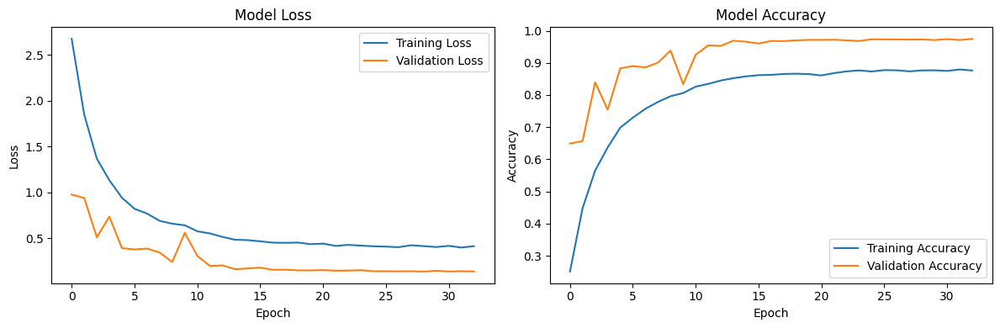

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, applications
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from keras_cv.layers import RandAugment

# Create augmentation layer once
rand_augment = RandAugment(
    value_range=(0, 255),
    augmentations_per_image=3,
    magnitude=0.65,
    magnitude_stddev=0.35,
    rate=1.0
)

def preprocess_train(image, label):
    image = tf.cast(image, tf.float32)
    image = rand_augment(image)

    image = tf.image.random_brightness(image, 0.2)
    image = tf.image.random_contrast(image, 0.9, 1.1)


    # Normalize
    image = image / 255.0
    return image, label

def preprocess_val(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

def create_datasets(X, y, batch_size=32):
    # Convert to float32 before creating datasets
    X = X.astype('float32')

    # Create training dataset
    train_ds = tf.data.Dataset.from_tensor_slices((X, y))
    train_ds = (train_ds
        .shuffle(2000)
        .map(preprocess_train, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    # Create validation dataset
    val_ds = tf.data.Dataset.from_tensor_slices((X, y))
    val_ds = (val_ds
        .map(preprocess_val, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    return train_ds, val_ds

def create_model():
    base_model = applications.EfficientNetV2B0(
        weights='imagenet',
        include_top=False,
        input_shape=(96, 96, 3)
    )

    for layer in base_model.layers[-15:]:
        layer.trainable = True

    inputs = layers.Input(shape=(96, 96, 3))
    x = base_model(inputs)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.45)(x)
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.00008))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.45)(x)
    outputs = layers.Dense(8, activation='softmax')(x)

    model = models.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Lion(learning_rate=3e-5),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Load data
data = np.load('processed_training_set.npz')
X_train, X_val, y_train, y_val = train_test_split(
    data['images'], data['labels'],
    test_size=0.2, random_state=42,
    stratify=data['labels']
)

# Create datasets
train_ds, _ = create_datasets(X_train, y_train, batch_size=28)
_, val_ds = create_datasets(X_val, y_val, batch_size=28)

# Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(data['labels']),
    y=data['labels'].flatten()
)
class_weights_dict = dict(enumerate(class_weights))

# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=4,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_EfficientNetV2B0_finetuned.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.3,
        patience=2,
        min_lr=1e-6
    )
]

# Train
model = create_model()
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)

# Plot results
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

# Save model
model.save_weights('weights_EfficientNetV2B0_finetuned.weights.h5')
model.save('EfficientNetV2B0_finetuned_model.keras')

Things to try in order :
- increase randaugment magnitude
- reduce dropout
- unfreeze more layer (20 for example)
- reduce keras.regularizers.l2(0.00008)


- add a layer dense of 1024




accuracy = 0.83

In [ ]:
%%writefile model.py
# file: model.py

import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, applications

class Model:
    def __init__(self):
        """Initializes the model's internal state and loads weights."""

        num_classes = 8
        input_shape = (96, 96, 3)

        base_model = applications.EfficientNetV2B0(
            weights=None,
            include_top=False,
            input_shape=input_shape
        )

        for layer in base_model.layers[-15:]:
            layer.trainable = True

        inputs = layers.Input(shape=input_shape)

        x = layers.Rescaling(1./255)(inputs)

        x = base_model(x)

        x = layers.GlobalAveragePooling2D()(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.45)(x)
        x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.00008))(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.45)(x)


        outputs = layers.Dense(num_classes, activation='softmax')(x)

        self.model = models.Model(inputs, outputs)

        self.model.load_weights('weights_EfficientNetV2B0_finetuned.weights.h5')

    def predict(self, X):

        X = np.asarray(X)
        predictions = self.model.predict(X)
        return np.argmax(predictions, axis=1)


Overwriting model.py


In [ ]:
from datetime import datetime
import zipfile

# Generate a filename with the current date and time
filename = f'submission_EfficientNetV2B0_finetuned_{datetime.now().strftime("%y%m%d_%H%M%S")}.zip'

with zipfile.ZipFile(filename, 'w') as zipf:
    zipf.write('model.py')
    zipf.write('weights_EfficientNetV2B0_finetuned.weights.h5')

print(f"Created zip file: {filename}")

Created zip file: submission_EfficientNetV2B0_finetuned_241120_232132.zip


# EfficientNetV2B0 with Hyperparameter tuning

## The below is our best model which got **.87 accuracy** in the **final phase** in codabench.


24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/100


I0000 00:00:1732474939.427788      99 service.cc:145] XLA service 0x7a7b9c004660 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732474939.427875      99 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  3/264 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - accuracy: 0.0868 - loss: 3.2149   

I0000 00:00:1732474993.614108      99 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


264/264 ━━━━━━━━━━━━━━━━━━━━ 166s 320ms/step - accuracy: 0.1971 - loss: 2.9403 - val_accuracy: 0.6102 - val_loss: 1.0414 - learning_rate: 5.0000e-05
Epoch 2/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.4585 - loss: 1.8056 - val_accuracy: 0.5361 - val_loss: 1.1924 - learning_rate: 5.0000e-05
Epoch 3/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 27s 97ms/step - accuracy: 0.5701 - loss: 1.3213 - val_accuracy: 0.7621 - val_loss: 0.6499 - learning_rate: 5.0000e-05
Epoch 4/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 26s 96ms/step - accuracy: 0.6592 - loss: 1.0175 - val_accuracy: 0.8765 - val_loss: 0.4941 - learning_rate: 5.0000e-05
Epoch 5/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.7355 - loss: 0.8388 - val_accuracy: 0.6733 - val_loss: 0.8978 - learning_rate: 5.0000e-05
Epoch 6/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 26s 95ms/step - accuracy: 0.7622 - loss: 0.7472 - val_accuracy: 0.9221 - val_loss: 0.3018 - learning_rate: 5.0000e-05
Epoch 7/100
264/264 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step -

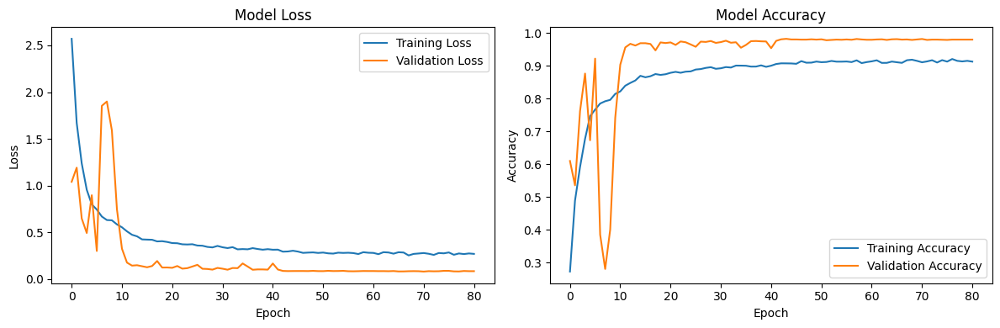

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, applications
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from keras_cv.layers import RandAugment

# Create augmentation layer once
rand_augment = RandAugment(
    value_range=(0, 255),
    augmentations_per_image=3, # stay 3
    magnitude=0.65, # increase
    magnitude_stddev=0.40, # increase
    rate=1.0
)

def preprocess_train(image, label):
    image = tf.cast(image, tf.float32)
    image = rand_augment(image)

    image = tf.image.random_brightness(image, 0.2)
    image = tf.image.random_contrast(image, 0.9, 1.1)

    # Normalize
    image = image / 255.0
    return image, label

def preprocess_val(image, label):
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

def create_datasets(X, y, batch_size=32):
    # Convert to float32 before creating datasets
    X = X.astype('float32')

    # Create training dataset
    train_ds = tf.data.Dataset.from_tensor_slices((X, y))
    train_ds = (train_ds
        .shuffle(2000)
        .map(preprocess_train, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    # Create validation dataset
    val_ds = tf.data.Dataset.from_tensor_slices((X, y))
    val_ds = (val_ds
        .map(preprocess_val, num_parallel_calls=tf.data.AUTOTUNE)
        .batch(batch_size)
        .prefetch(tf.data.AUTOTUNE))

    return train_ds, val_ds

def create_model():
    base_model = applications.EfficientNetV2B0(
        weights='imagenet',
        include_top=False,
        input_shape=(96, 96, 3)
    )
    # gaussian noise
    for layer in base_model.layers[-20:]: # Modification on number of layers
        layer.trainable = True

    inputs = layers.Input(shape=(96, 96, 3))
    x = base_model(inputs)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.45)(x) # lower
    x = layers.Dense(512, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.00005))(x) # lower l2, dense to change (1024) maybe even try a new layer
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.45)(x) # lower
    outputs = layers.Dense(8, activation='softmax')(x)

    model = models.Model(inputs, outputs)

    model.compile(
        optimizer=tf.keras.optimizers.Lion(learning_rate=5e-5),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

# Load data
data = np.load('/kaggle/input/proccessed-blood-cells/processed_training_set.npz')
X_train, X_val, y_train, y_val = train_test_split(
    data['images'], data['labels'],
    test_size=0.2, random_state=42,
    stratify=data['labels']
)

# Create datasets
train_ds, _ = create_datasets(X_train, y_train)
_, val_ds = create_datasets(X_val, y_val)

# Class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(data['labels']),
    y=data['labels'].flatten()
)
class_weights_dict = dict(enumerate(class_weights))

# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    ),
    callbacks.ModelCheckpoint(
        filepath='weights_EfficientNetV2B0_finetuned.weights.h5',
        monitor='val_loss',
        save_best_only=True,
        save_weights_only=True,
        mode='min'
    ),
    callbacks.ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.2,
        patience=5,
        min_lr=1e-6
    )
]

# Train
model = create_model()
history = model.fit(
    train_ds,
    epochs=100,
    validation_data=val_ds,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)

# Plot results
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.tight_layout()
plt.show()

# Save model
model.save_weights('weights_EfficientNetV2B0_finetuned.weights.h5')
model.save('EfficientNetV2B0_finetuned_model.keras')

This model got **0.87** on codabench.

Here are some adjustments we attempted on Kaggle, which unfortunately resulted in lower performance:  

- **Adding an intermediate layer** with 1024 neurons, along with batch normalization and dropout. However, the test score significantly dropped to 0.12.  
- **Replacing the penultimate layer** of 512 neurons with 1024 neurons, which stayed blocked on the preparing state on cadabench.  

# ConvNextBase using augmentation:

*   The accuracy of this model in the validation and test set was 0.93 and 0.8965 respectively.
*   When we tested this on the codabench test set the accuracy decreased to **0.38** in the **development phase**.
*   Which is a clear sign of overfitting.

### Data loading

In [ ]:
import numpy as np
import pandas as pd

with np.load('/kaggle/input/processed-bloodcells-dataset/processed_training_set.npz', allow_pickle=True) as data:
  print(data.files)
  print(data['images'])
  print(data['labels'])
  X = data['images']
  y = data['labels']


['images', 'labels']
[[[[244 221 197]
   [243 223 198]
   [244 221 197]
   ...
   [254 232 206]
   [253 230 206]
   [255 232 206]]

  [[243 223 198]
   [244 221 197]
   [244 221 197]
   ...
   [255 233 207]
   [254 232 206]
   [254 232 206]]

  [[244 221 197]
   [244 221 197]
   [244 221 197]
   ...
   [255 233 206]
   [254 234 206]
   [255 233 206]]

  ...

  [[205 167 162]
   [205 167 162]
   [205 167 162]
   ...
   [255 232 208]
   [255 232 208]
   [254 232 208]]

  [[212 174 166]
   [209 171 166]
   [209 171 166]
   ...
   [254 232 208]
   [254 232 208]
   [254 232 208]]

  [[215 180 170]
   [215 180 170]
   [213 178 168]
   ...
   [254 232 208]
   [255 232 208]
   [255 232 208]]]


 [[[255 233 206]
   [255 233 206]
   [255 233 206]
   ...
   [169 130 148]
   [169 130 148]
   [169 130 148]]

  [[255 233 206]
   [255 233 206]
   [255 233 206]
   ...
   [169 130 148]
   [169 130 148]
   [168 129 147]]

  [[255 232 205]
   [255 232 205]
   [255 232 205]
   ...
   [168 129 147]
   [167

In [ ]:
# Define a mapping of labels to their corresponding digit names
labels = {0:'Basophil', 1:'Eosinophil', 2:'Erythroblast', 3:'Immature granulocytes', 4:'Lymphocyte', 5:'Monocyte', 6:'Neutrophil', 7:'Platelet'}

# Save unique labels
unique_labels = list(labels.values())

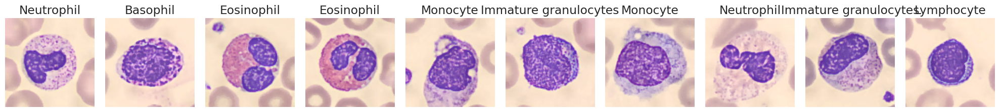

In [ ]:
# Display a sample of images from the training-validation dataset
num_img = 10
random_indices = random.sample(range(len(X)), num_img)

fig, axes = plt.subplots(1, num_img, figsize=(20, 20))

# Iterate through the selected number of images
for i, idx in enumerate(random_indices):
    ax = axes[i % num_img]
    ax.imshow(np.squeeze(X[idx]), vmin=0., vmax=1.)
    ax.set_title(f'{labels[y[idx][0]]}')
    ax.axis('off')


# Adjust layout and display the images
plt.tight_layout()
plt.show()

In [ ]:
X.shape, y.shape

((10530, 96, 96, 3), (10530, 1))

In [ ]:
# As we can see with the help of data augmentation the dataset is balanced
print('Counting occurrences of target classes:')
print(pd.DataFrame(y, columns=['labels'])['labels'].value_counts())

Counting occurrences of target classes:
labels
6    2227
3    1773
1    1649
7    1549
2    1041
4     819
5     803
0     669
Name: count, dtype: int64


### Data preprocessing and Augmenatation

In [ ]:
# Define the new target size for resizing
target_size = (128, 128)

# Function to resize images
def resize_images(X, target_size):
    """
    Resize a dataset of images to the specified target size.
    Args:
        X: Numpy array of images (shape: [num_images, height, width, channels])
        target_size: Tuple specifying new (height, width)
    Returns:
        Resized images as a numpy array
    """
    resized_images = []
    for img in X:
        resized = tf.image.resize(img, target_size)  # Resize image
        resized_images.append(resized.numpy())
    return np.array(resized_images)

In [ ]:
# Resize the entire dataset
X_resized = resize_images(X, target_size)
print(f"Resized dataset shape: {X_resized.shape}")

Resized dataset shape: (10530, 128, 128, 3)


In [ ]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X_resized, y, random_state=seed, test_size=0.1,stratify=y, shuffle=True)

In [ ]:
# Print the shapes of the loaded datasets
print("Training-Validation Data Shape:", X_train_val.shape)
print("Training-Validation Label Shape:", y_train_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", y_test.shape)

Training-Validation Data Shape: (9477, 128, 128, 3)
Training-Validation Label Shape: (9477, 1)
Test Data Shape: (1053, 128, 128, 3)
Test Label Shape: (1053, 1)


In [ ]:
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, random_state=seed, test_size=0.1,stratify = y_train_val, shuffle=True)

In [ ]:
print('Training set shape:\t',X_train.shape, y_train.shape)
print('Validation set shape:\t',X_val.shape, y_val.shape)
print('Test set shape:\t\t',X_test.shape, y_test.shape)

Training set shape:	 (8529, 128, 128, 3) (8529, 1)
Validation set shape:	 (948, 128, 128, 3) (948, 1)
Test set shape:		 (1053, 128, 128, 3) (1053, 1)


In [ ]:
# Oversample the training set to balance classes
oversampler = RandomOverSampler(random_state=42)
X_train_flat = X_train.reshape(X_train.shape[0], -1)  # Flatten images for oversampling
X_train_balanced, y_train_balanced = oversampler.fit_resample(X_train_flat, y_train)
X_train_balanced = X_train_balanced.reshape(-1, target_size[0], target_size[1], 3)  # Reshape back to original

print(f"Balanced training set shape: {X_train_balanced.shape}")

Balanced training set shape: (14424, 128, 128, 3)


In [ ]:
# Preprocessing for data augmentation
data_augmentation = tf.keras.Sequential([
    tfkl.RandomRotation(0.5),
    tfkl.RandomTranslation(height_factor=0.2, width_factor=0.2, fill_mode="reflect"),
    tfkl.RandomFlip("horizontal"),
], name='data_augmentation')

In [ ]:
print('Training set shape:\t',X_train.shape, y_train.shape)
print('Training set shape:\t',X_train_balanced.shape, y_train_balanced.shape)
print('Validation set shape:\t',X_val.shape, y_val.shape)
print('Test set shape:\t\t',X_test.shape, y_test.shape)

Training set shape:	 (8529, 128, 128, 3) (8529, 1)
Training set shape:	 (14424, 128, 128, 3) (14424,)
Validation set shape:	 (948, 128, 128, 3) (948, 1)
Test set shape:		 (1053, 128, 128, 3) (1053, 1)


In [ ]:
# Inspect the target
print('Counting occurrences of target classes:')
print(pd.DataFrame(y_train_balanced, columns=['labels'])['labels'].value_counts())

Counting occurrences of target classes:
labels
3    1803
7    1803
0    1803
2    1803
4    1803
1    1803
5    1803
6    1803
Name: count, dtype: int64


In [ ]:
# Normalize data to the range [0, 1]
X_train_balanced = (X_train_balanced / 255).astype('float32')
X_val =  (X_val / 255).astype('float32')
X_test = (X_test / 255).astype('float32')

# Convert labels to categorical format using one-hot encoding
y_train_balanced = tfk.utils.to_categorical(y_train_balanced)
y_val = tfk.utils.to_categorical(y_val)
y_test = tfk.utils.to_categorical(y_test)

In [ ]:
# Print the shapes of the loaded datasets
print("Training-Validation Data Shape:", X_train_balanced.shape)
print("Training-Validation Label Shape:", y_train_balanced.shape)
print("Validation Data Shape:", X_val.shape)
print("Validation Label Shape:", y_val.shape)
print("Test Data Shape:", X_test.shape)
print("Test Label Shape:", y_test.shape)

Training-Validation Data Shape: (14424, 128, 128, 3)
Training-Validation Label Shape: (14424, 8)
Validation Data Shape: (948, 128, 128, 3)
Validation Label Shape: (948, 8)
Test Data Shape: (1053, 128, 128, 3)
Test Label Shape: (1053, 8)


In [ ]:
# Compare categorical label and "default" label representation
print('Categorical label:', y_train_balanced[1])           # Display the categorical label
print('"Default" label:', np.argmax(y_train_balanced[1]))   # Display the equivalent numeric label

Categorical label: [0. 0. 0. 0. 0. 0. 0. 1.]
"Default" label: 7


### Model Training

In [ ]:
# Define key model parameters
input_shape = X_train_balanced.shape[1:]  # Input shape for the model
output_shape = y_train_balanced.shape[1]  # Output shape for the model
batch_size = 512     # Batch size for training
epochs = 50      # Number of training epochs

# Print the defined parameters
print("Epochs:", epochs)
print("Batch Size:", batch_size)
print("Input Shape:", input_shape)
print("Output Shape:", output_shape)

Epochs: 50
Batch Size: 512
Input Shape: (128, 128, 3)
Output Shape: 8


In [ ]:
# Set up mirrored strategy for multi-GPU training
strategy = tf.distribute.MirroredStrategy()

print(f"Number of devices: {strategy.num_replicas_in_sync}")  # Verify GPUs being used

# Fine-tuning within strategy.scope()
with strategy.scope():

    #Initializing the ConvNeXtLarge model

    model1 = tf.keras.applications.ConvNeXtBase(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape,
        pooling='avg',
        )
    # The convolutional layer in the convnextlarge was set to not trainable

    model1.trainable = False
    for layer in model1.layers:
        layer.trainable = False

    # Create an input layer with the shape of our images
    inputs = tfk.Input(input_shape)

    # Apply data augmentation to the input
    augmented_inputs = data_augmentation(inputs)
    # Connect ConvNeXtXLarge to the input
    x = model1(augmented_inputs)


    x = tfkl.Dense(256, activation='relu',kernel_initializer=tf.keras.initializers.HeUniform(42))(x)
    x = tfkl.Dropout(0.5)(x)
    x = tfkl.Dense(128, activation='relu',kernel_initializer=tf.keras.initializers.HeUniform(42))(x)
    x = tfkl.Dropout(0.5)(x)

    # Add a Dense layer with 2 units and softmax activation as the classifier
    outputs = tfkl.Dense(8, activation='softmax',kernel_initializer=tf.keras.initializers.GlorotUniform(42))(x)

    # Create a Model connecting input and output
    model = tfk.Model(inputs=inputs, outputs=outputs, name='model')

    # Compile the model with Categorical Cross-Entropy loss and Adam optimizer
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Lion(learning_rate=1e-4), metrics=['accuracy'])


    # Display a summary of the model architecture
    model.summary(expand_nested=True, show_trainable=True)

    # Plot the model architecture
    #tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)


Number of devices: 2


Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_12 (InputLayer) │ (None, 128, 128, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ data_augmentation           │ (None, 128, 128, 3)   │          0 │   -   │
│ (Sequential)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_rotation        │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomRotation)            │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_translation     │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomTranslation)         │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_flip            │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomFlip)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ convnext_base (Functional)  │ (None, 1024)          │ 87,566,464 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ input_layer_7          │ (None, 128, 128, 3)   │          0 │   -   │
│ (InputLayer)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 128, 128, 3)   │          0 │   -   │
│ convnext_base_prestem_norm… │                       │            │       │
│ (Normalization)             │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ convnext_base_stem     │ (None, 32, 32, 128)   │      6,528 │   N   │
│ (Sequential)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 32, 32, 128)   │      6,272 │   N   │
│ convnext_base_stem_conv     │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 32, 32, 128)   │        256 │   N   │
│ convnext_base_stem_layerno… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 128)   │      6,400 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 128)   │        256 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 512)   │     66,048 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Dense)                     │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 512)   │          0 │   -   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Activation)                │                       │            │     

 Total params: 87,862,792 (335.17 MB)

 Trainable params: 296,328 (1.13 MB)

 Non-trainable params: 87,566,464 (334.04 MB)

In [ ]:
# Training settings
batch_size = 256 * strategy.num_replicas_in_sync  # Scale batch size for multiple GPUs

In [ ]:
# Train the model
tl_history = model.fit(
    x = (X_train_balanced), # We need to apply the preprocessing thought for the MobileNetV2 network
    y = y_train_balanced,
    batch_size = batch_size,
    epochs = epochs,
    validation_data = ((X_val), y_val),
    callbacks = [tfk.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', patience=5, restore_best_weights=True)]
).history

# Calculate and print the final validation accuracy
final_val_accuracy = round(max(tl_history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 172s 5s/step - accuracy: 0.1447 - loss: 4.6598 - val_accuracy: 0.2616 - val_loss: 1.7591
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 147s 5s/step - accuracy: 0.2222 - loss: 2.2991 - val_accuracy: 0.4916 - val_loss: 1.5962
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 143s 5s/step - accuracy: 0.3101 - loss: 1.8615 - val_accuracy: 0.6160 - val_loss: 1.4154
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 130s 4s/step - accuracy: 0.4043 - loss: 1.6154 - val_accuracy: 0.6350 - val_loss: 1.1436
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 140s 5s/step - accuracy: 0.4787 - loss: 1.4487 - val_accuracy: 0.6688 - val_loss: 0.9901
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.5282 - loss: 1.3174 - val_accuracy: 0.6941 - val_loss: 0.8897
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 142s 5s/step - accuracy: 0.5679 - loss: 1.2162 - val_accuracy: 0.6962 - val_loss: 0.8200
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 147s 5s/step - accuracy: 0.6108 - loss: 1.1127 - val_accuracy: 0.7236 - v

In [ ]:


# Save the trained model to a file with the accuracy included in the filename
model_filename = 'ConvNextBaseV4_'+str(final_val_accuracy)+'.keras'
model.save(model_filename)

# Delete the model to free up resources
del model

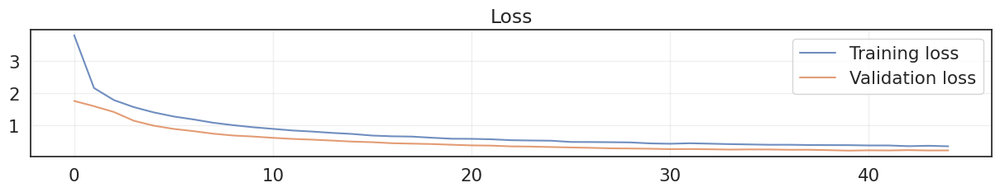

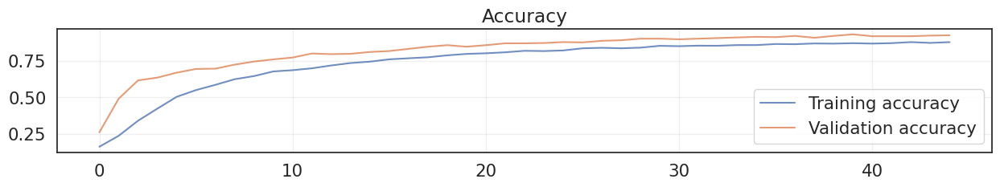

In [ ]:
# Plot training and validation loss
plt.figure(figsize=(15, 2))
plt.plot(tl_history['loss'], label='Training loss', alpha=.8)
plt.plot(tl_history['val_loss'], label='Validation loss', alpha=.8)
plt.title('Loss')
plt.legend()
plt.grid(alpha=.3)

# Plot training and validation accuracy
plt.figure(figsize=(15, 2))
plt.plot(tl_history['accuracy'], label='Training accuracy', alpha=.8)
plt.plot(tl_history['val_accuracy'], label='Validation accuracy', alpha=.8)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer_12 (InputLayer) │ (None, 128, 128, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ data_augmentation           │ (None, 128, 128, 3)   │          0 │   -   │
│ (Sequential)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_rotation        │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomRotation)            │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_translation     │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomTranslation)         │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ random_flip            │ (None, 128, 128, 3)   │          0 │   -   │
│ (RandomFlip)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ convnext_base (Functional)  │ (None, 1024)          │ 87,566,464 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ input_layer_7          │ (None, 128, 128, 3)   │          0 │   -   │
│ (InputLayer)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 128, 128, 3)   │          0 │   -   │
│ convnext_base_prestem_norm… │                       │            │       │
│ (Normalization)             │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └ convnext_base_stem     │ (None, 32, 32, 128)   │      6,528 │   Y   │
│ (Sequential)                │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 32, 32, 128)   │      6,272 │   N   │
│ convnext_base_stem_conv     │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│       └                     │ (None, 32, 32, 128)   │        256 │   N   │
│ convnext_base_stem_layerno… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 128)   │      6,400 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Conv2D)                    │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 128)   │        256 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (LayerNormalization)        │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 512)   │     66,048 │   N   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Dense)                     │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│    └                        │ (None, 32, 32, 512)   │          0 │   -   │
│ convnext_base_stage_0_bloc… │                       │            │       │
│ (Activation)                │                       │            │     

 Total params: 88,159,122 (336.30 MB)

 Trainable params: 296,328 (1.13 MB)

 Non-trainable params: 87,566,464 (334.04 MB)

 Optimizer params: 296,330 (1.13 MB)

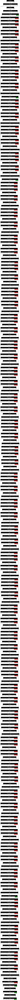

In [ ]:
# Load the saved model
model = tfk.models.load_model('ConvNextBaseV4_93.04.keras')

# Display a summary of the model architecture
model.summary(expand_nested=True, show_trainable=True)

# Plot the model architecture
tfk.utils.plot_model(model, expand_nested=True, show_trainable=True, show_shapes=True, dpi=70)

### Inference

In [ ]:
# Predict labels for the entire test set
predictions = model.predict(X_test, verbose=0)

# Display the shape of the predictions
print("Predictions Shape:", predictions.shape)

Predictions Shape: (1053, 8)


Accuracy score over the test set: 0.8965
Precision score over the test set: 0.8991
Recall score over the test set: 0.8965
F1 score over the test set: 0.8971


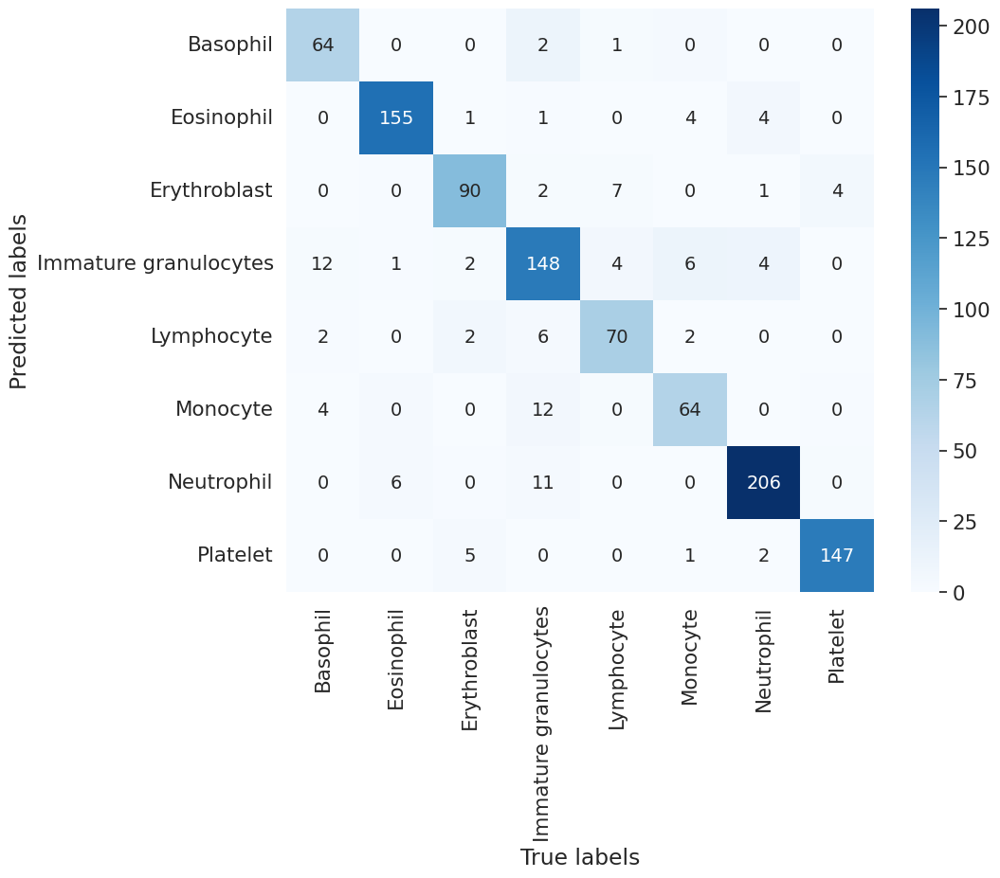

In [ ]:
# Convert predictions to class labels
pred_classes = np.argmax(predictions, axis=-1)

# Extract ground truth classes
true_classes = np.argmax(y_test, axis=-1)

# Calculate and display test set accuracy
accuracy = accuracy_score(true_classes, pred_classes)
print(f'Accuracy score over the test set: {round(accuracy, 4)}')

# Calculate and display test set precision
precision = precision_score(true_classes, pred_classes, average='weighted')
print(f'Precision score over the test set: {round(precision, 4)}')

# Calculate and display test set recall
recall = recall_score(true_classes, pred_classes, average='weighted')
print(f'Recall score over the test set: {round(recall, 4)}')

# Calculate and display test set F1 score
f1 = f1_score(true_classes, pred_classes, average='weighted')
print(f'F1 score over the test set: {round(f1, 4)}')

# Compute the confusion matrix
cm = confusion_matrix(true_classes, pred_classes)

# Combine numbers and percentages into a single string for annotation
annot = np.array([f"{num}" for num in cm.flatten()]).reshape(cm.shape)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm.T, annot=annot, fmt='', xticklabels=list(labels.values()), yticklabels=list(labels.values()), cmap='Blues')
plt.xlabel('True labels')
plt.ylabel('Predicted labels')
plt.show()

# MobileNetV2 for Blood Cell Classification
MobileNetV2 is a lightweight and efficient model architecture designed for mobile and embedded devices. It uses depthwise separable convolutions to reduce computation while maintaining accuracy. In this section, we'll fine-tune a pretrained MobileNetV2 model on a blood cell dataset with data augmentation, class weighting, and transfer learning.


Import Libraries

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks, Input
from tensorflow.keras.applications import MobileNetV2
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

Load and Preprocess the Dataset

In [ ]:
# Load data
data = np.load('augmented_blood_cell_dataset.npz')  # Update the dataset path if necessary
X = data['images']
y = data['labels']

# Remove classes with less than 2 samples
from collections import Counter
class_counts = Counter(y.argmax(axis=1))
classes_to_remove = [cls for cls, count in class_counts.items() if count < 2]
if classes_to_remove:
    mask = ~np.isin(y.argmax(axis=1), classes_to_remove)
    X = X[mask]
    y = y[mask]
    print(f"Removed classes with only one sample: {classes_to_remove}")

# Preprocess data
def preprocess_data(X, y, test_size=0.2):
    X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=42, stratify=y.argmax(axis=1))
    return X_train / 255.0, X_val / 255.0, y_train, y_val  # Normalize to [0,1]

X_train, X_val, y_train, y_val = preprocess_data(X, y)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y.argmax(axis=1)),
    y=y.argmax(axis=1)
)
class_weights_dict = dict(enumerate(class_weights))


Define the MobileNetV2 Model

In [ ]:
# Data Augmentation
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
])

# Pretrained Model with Fine-Tuning
def create_model(input_shape=(96, 96, 3), num_classes=8):
    base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
    base_model.trainable = False  # Freeze the base model initially

    input_layer = Input(shape=input_shape)
    x = data_augmentation(input_layer)  # Apply augmentation to the input layer
    x = base_model(x)
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.Dropout(0.5)(x)  # Regularization
    x = layers.BatchNormalization()(x)
    output_layer = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=input_layer, outputs=output_layer)
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

model = create_model()


Train the Model

In [ ]:
# Callbacks
callbacks_list = [
    callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

# Training the Model
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,  # Use early stopping
    batch_size=32,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)

# Fine-tuning: Unfreezing some layers of the base model
model.layers[1].trainable = True  # Unfreeze base model
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

history_fine_tune = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=10,
    batch_size=32,
    class_weight=class_weights_dict,
    callbacks=callbacks_list
)


Evaluate and Visualize Results

In [ ]:
# Evaluating Model and Plotting Results
def plot_training_history(history):
    plt.figure(figsize=(12, 4))
    # Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    # Accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

plot_training_history(history_fine_tune)

# Predictions and Confusion Matrix
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true_classes = np.argmax(y_val, axis=1)

cm = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=np.unique(y_true_classes), yticklabels=np.unique(y_true_classes))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Class')
plt.ylabel('True Class')
plt.show()


Got .40 accuracy in the test set